2024-03-08 17:45:49.917280: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


Start loading raw data.
Finish loading raw data.
Start filtering low-quality cells and SNPs.


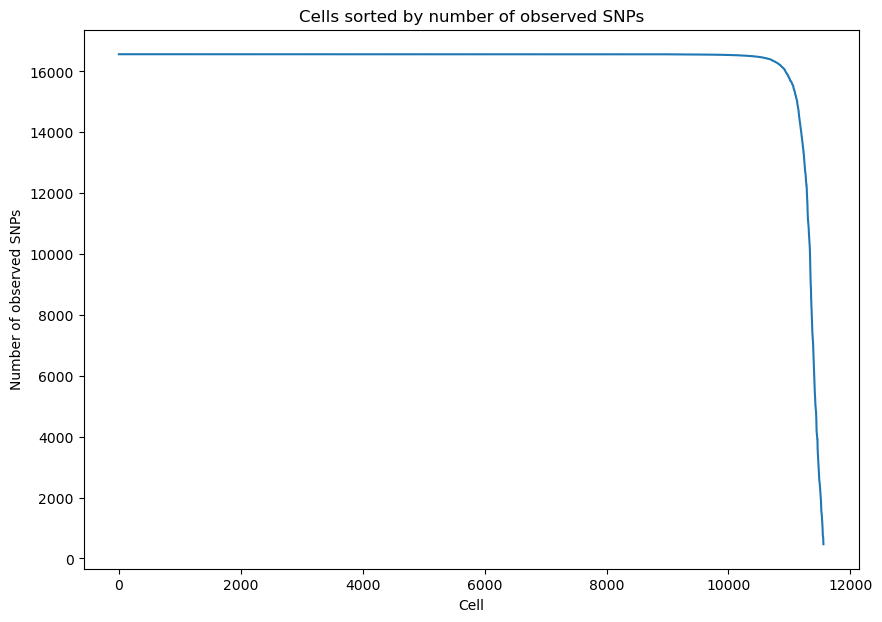

Please determine y-axis threshold in the plot to filter low-quality cells with low number of observed SNPs.   16000


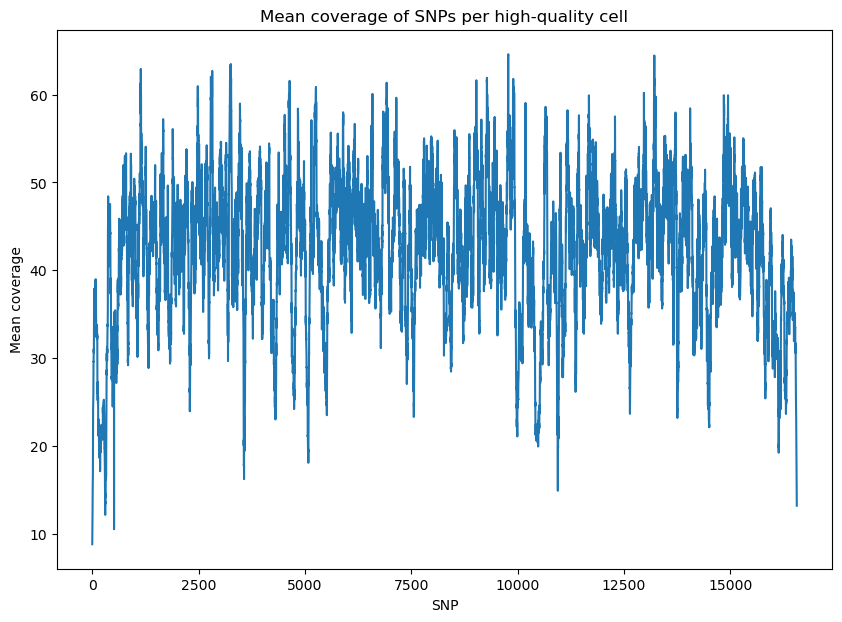

Please determine y-axis threshold in the plot to filter low-quality SNPs with low coverage.   0


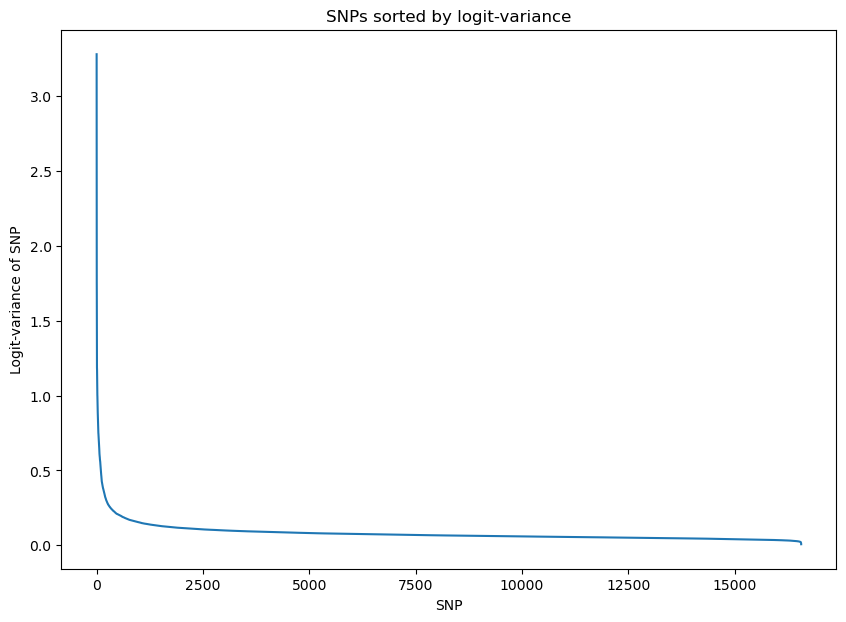

Please determine y-axis threshold in the plot to filter low-quality SNPs with low logit-variance.   0.5
Finish filtering low-quality data, 10936 cells and 100 SNPs will be used for downstream analysis.
Start training VAE.
Epoch[10/2000], Cost: 22.658224
Epoch[20/2000], Cost: 11.446808
Epoch[30/2000], Cost: 6.372324
Epoch[40/2000], Cost: 5.123841
Epoch[50/2000], Cost: 4.810817
Epoch[60/2000], Cost: 4.698393
Epoch[70/2000], Cost: 4.650634
Epoch[80/2000], Cost: 4.621338
Epoch[90/2000], Cost: 4.605584
Epoch[100/2000], Cost: 4.591067
Epoch[110/2000], Cost: 4.579263
Epoch[120/2000], Cost: 4.569750
Epoch[130/2000], Cost: 4.561044
Epoch[140/2000], Cost: 4.552670
Epoch[150/2000], Cost: 4.544319
Epoch[160/2000], Cost: 4.539070
Epoch[170/2000], Cost: 4.532715
Epoch[180/2000], Cost: 4.526767
Epoch[190/2000], Cost: 4.520647
Epoch[200/2000], Cost: 4.517437
Epoch[210/2000], Cost: 4.512911
Epoch[220/2000], Cost: 4.508573
Epoch[230/2000], Cost: 4.505205
Epoch[240/2000], Cost: 4.499816
Epoch[250/2000], 

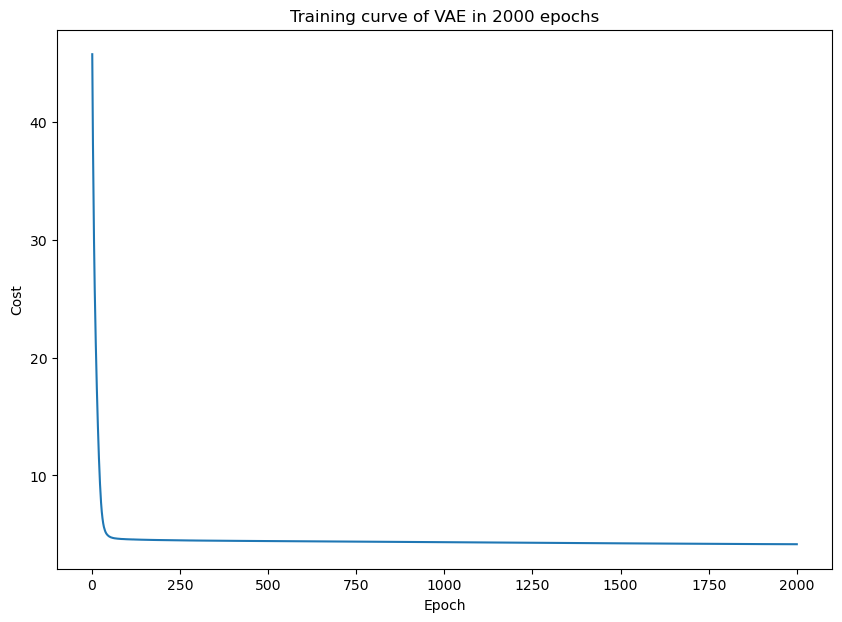

Start learning PCA and UMAP of latent space in VAE.
Finish learning, PCA and UMAP of latent space will be shown below.


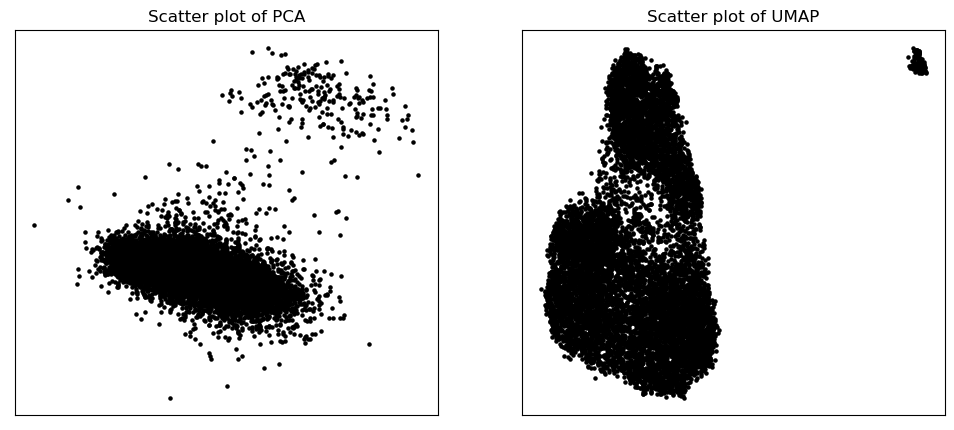

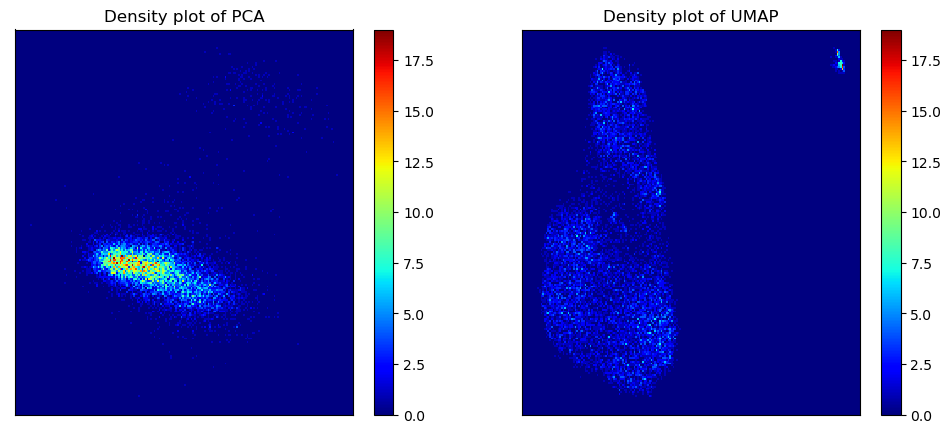

Start clustering.
Finish clustering.
PCA and UMAP of individual clusters will be shown below.


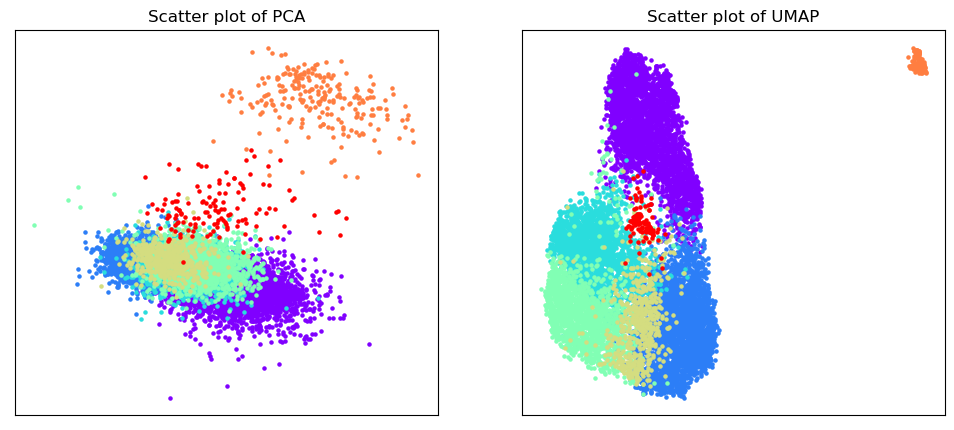

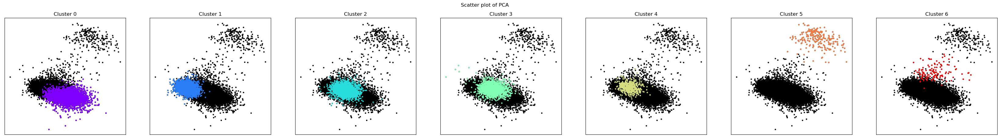

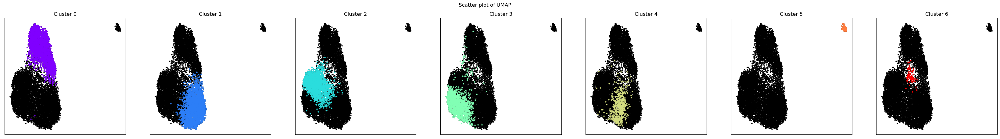

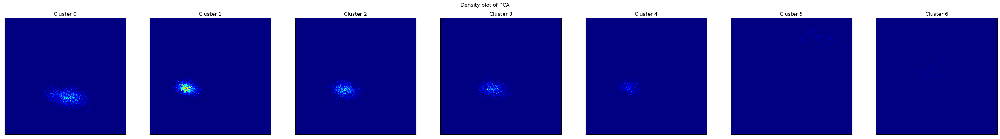

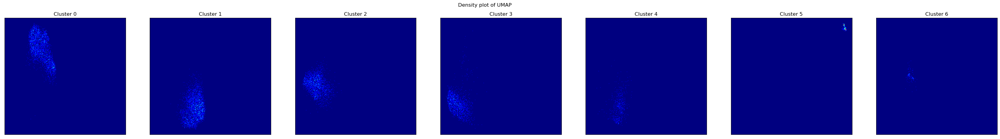

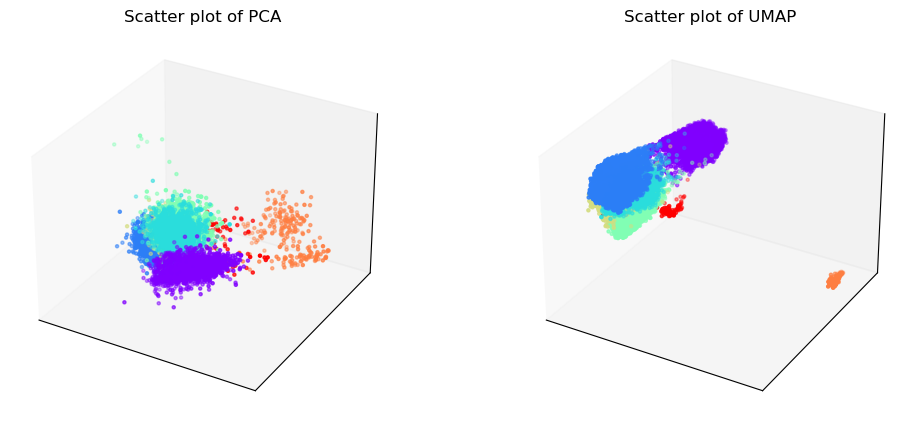

Phylogenetic tree in latent space will be shown below.


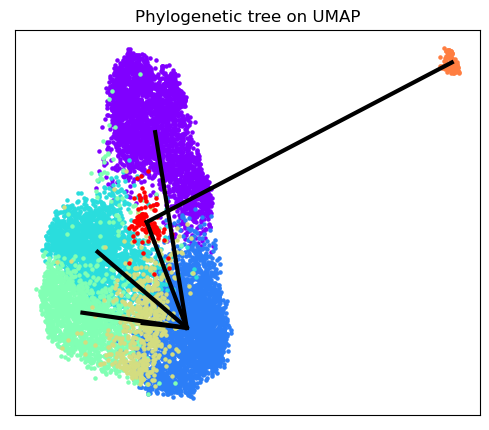

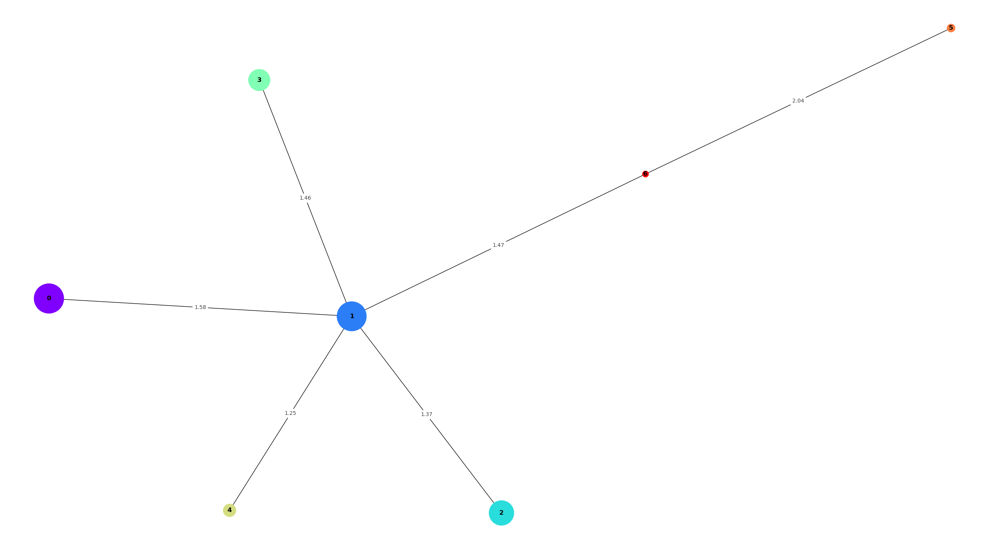

SNP-allelic ratios of 10936 cells and 50 SNPs will be shown below.


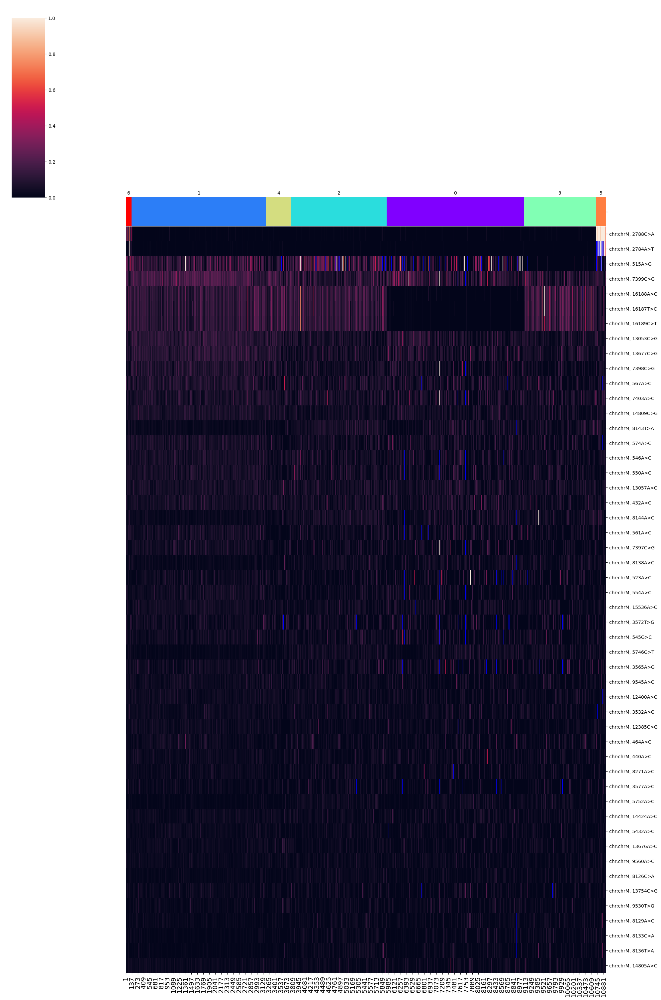

SNPs sorted by lowest p-value will be shown below


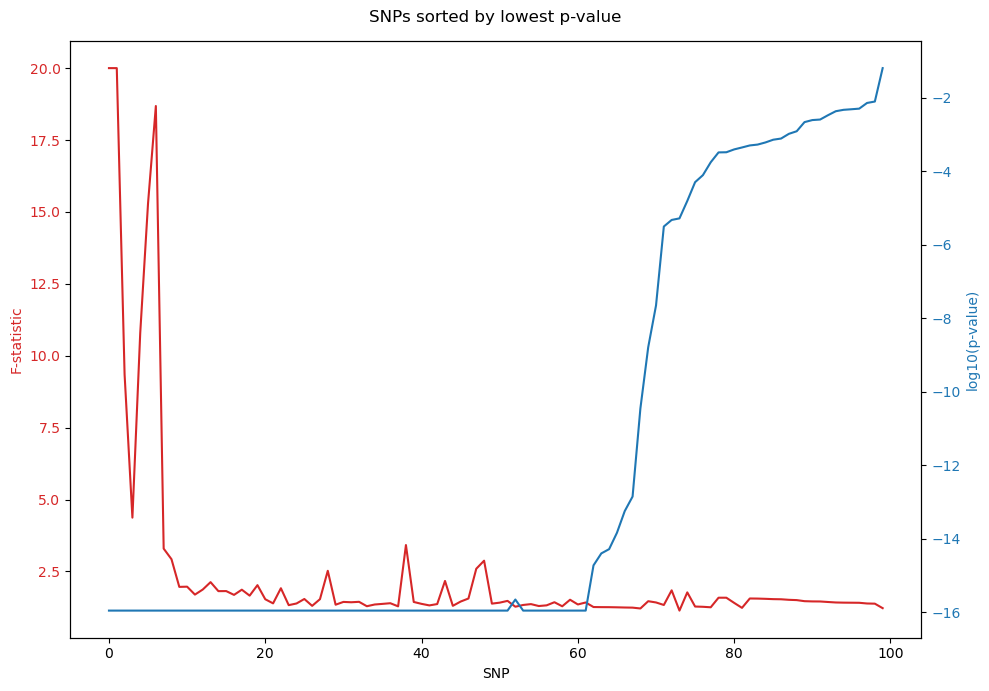

In [1]:
%run /home/u3570318/mount2/figures_final2/notebook2/SNPmanifold.ipynb
test1 = SNP_VAE(path = "/home/u3570318/mount2/figures_final2/data/CD34_PBMC")
test1.filtering()
test1.training()
test1.clustering(algorithm = "leiden_full")
test1.phylogeny()

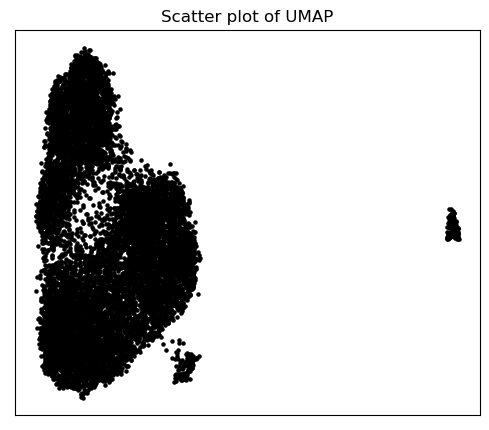

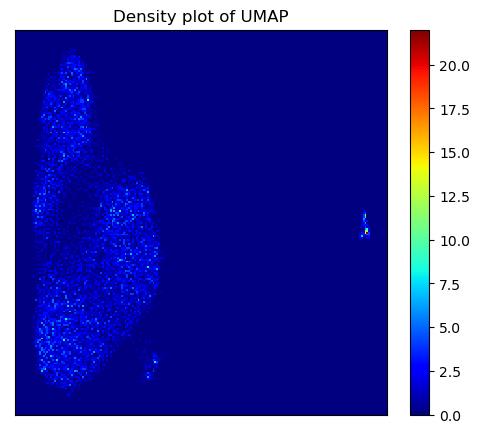

Start clustering.
Finish clustering.
PCA and UMAP of individual clusters will be shown below.


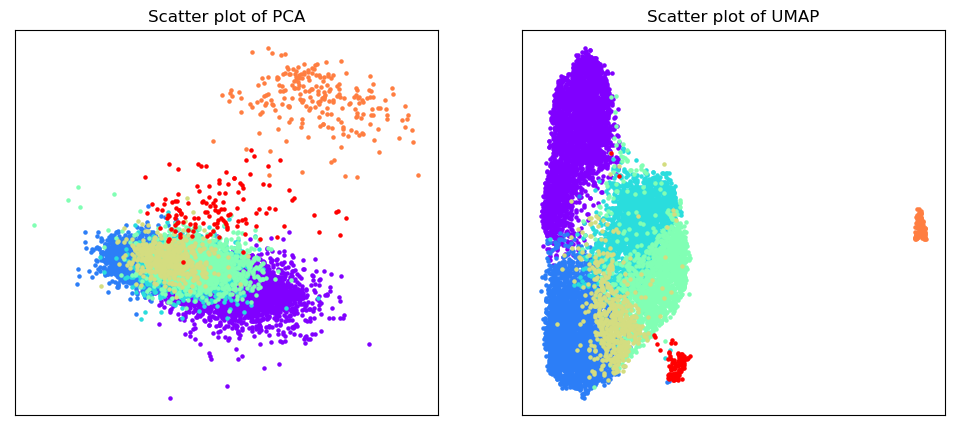

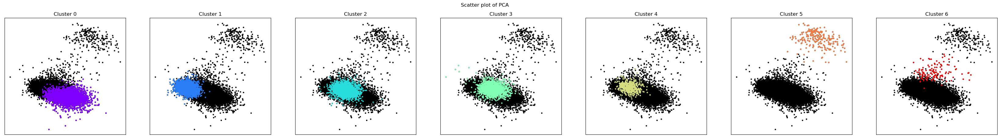

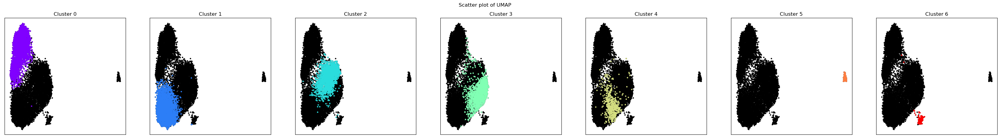

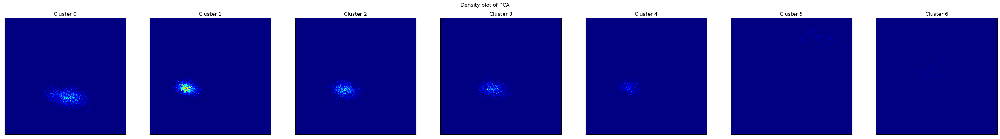

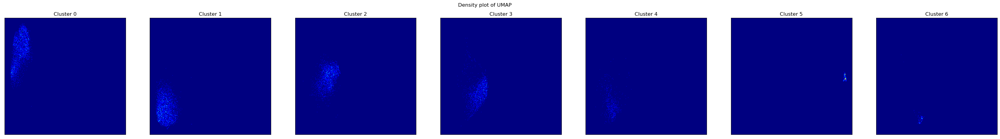

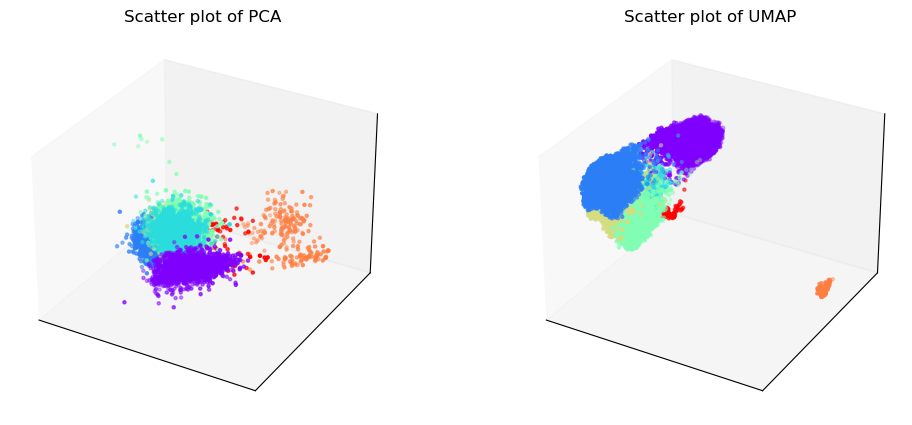

Phylogenetic tree in latent space will be shown below.


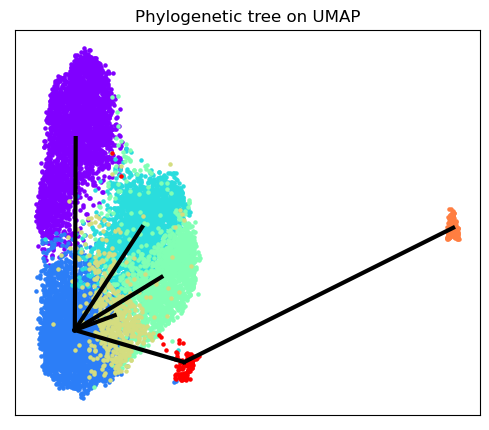

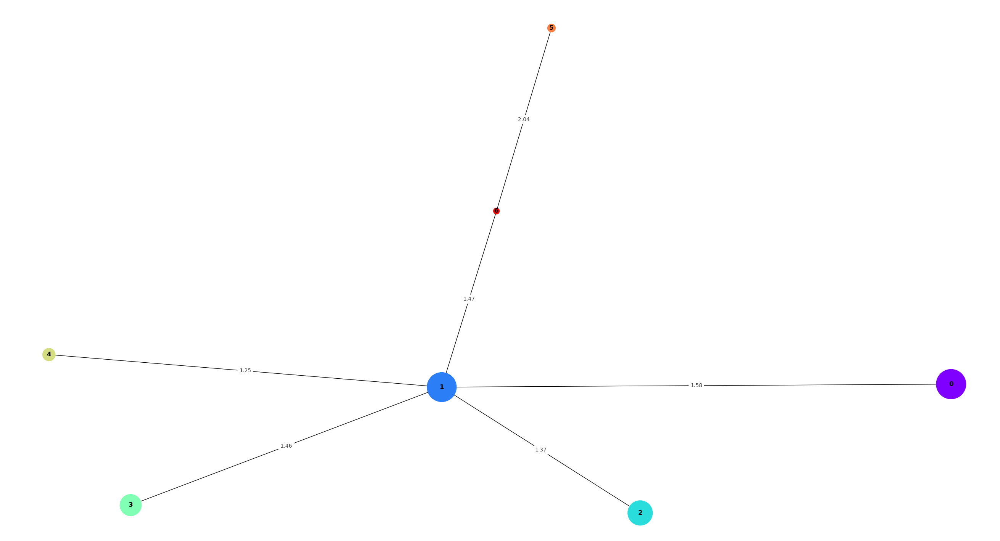

SNP-allelic ratios of 10936 cells and 50 SNPs will be shown below.


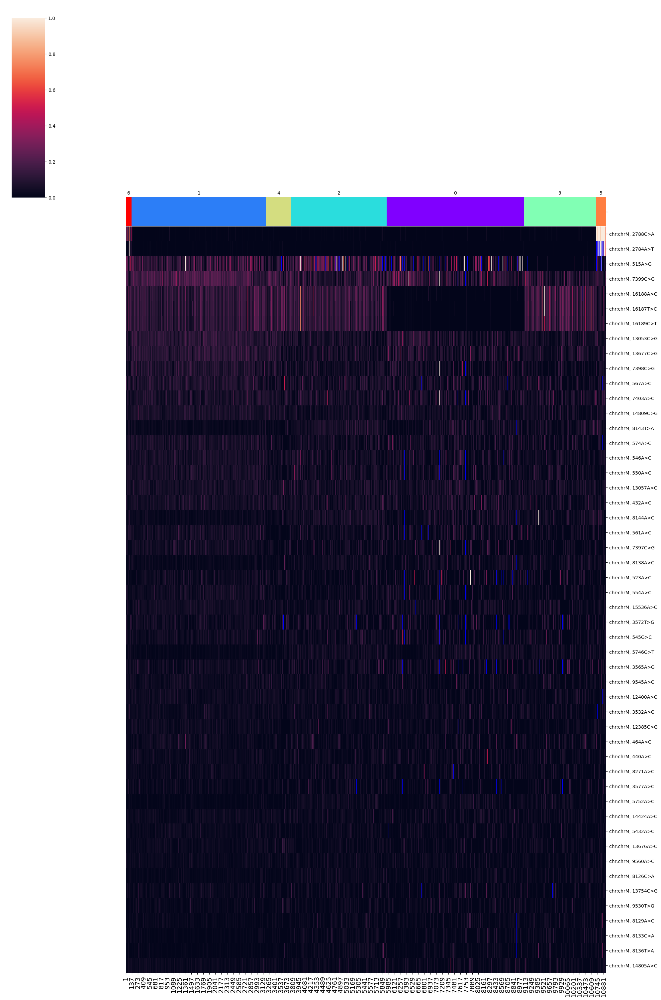

SNPs sorted by lowest p-value will be shown below


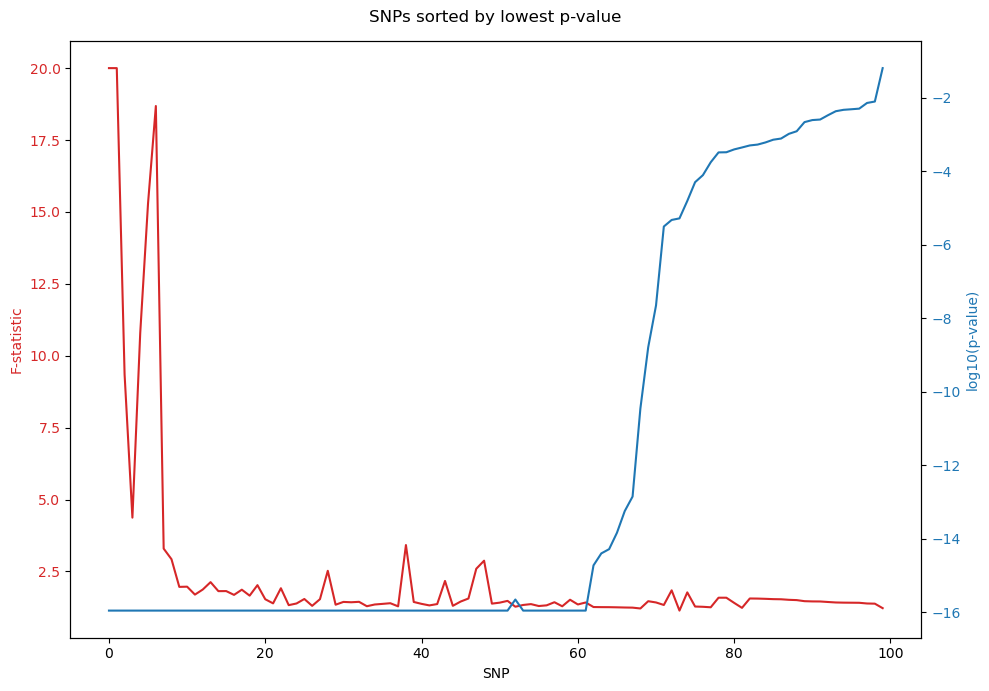

In [13]:
test1.retrain_umap()
test1.clustering(algorithm = "leiden_full")
test1.phylogeny()

In [15]:
import copy
test2 = copy.deepcopy(test1)

Start clustering.
Finish clustering.
PCA and UMAP of individual clusters will be shown below.


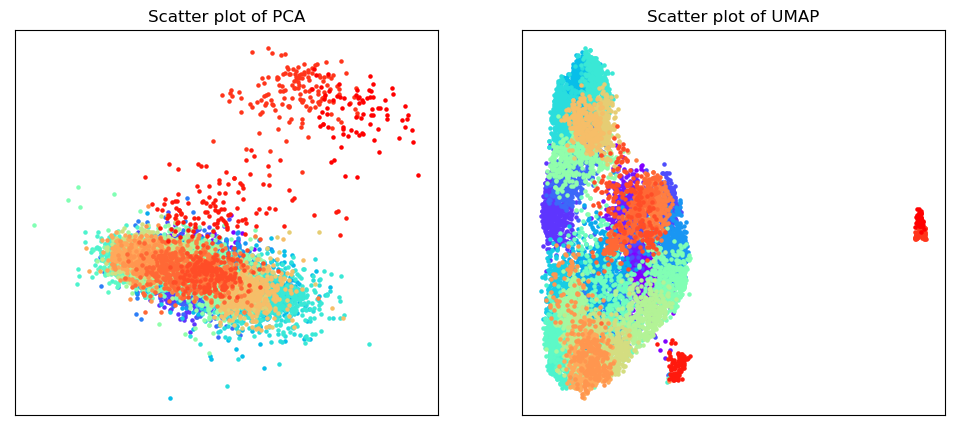

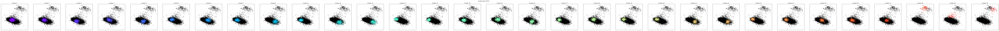

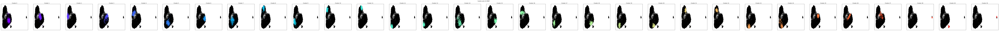

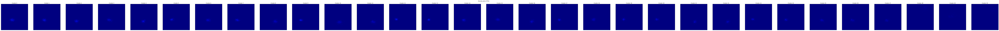

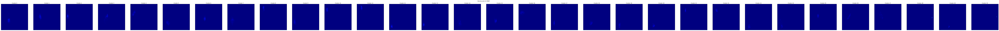

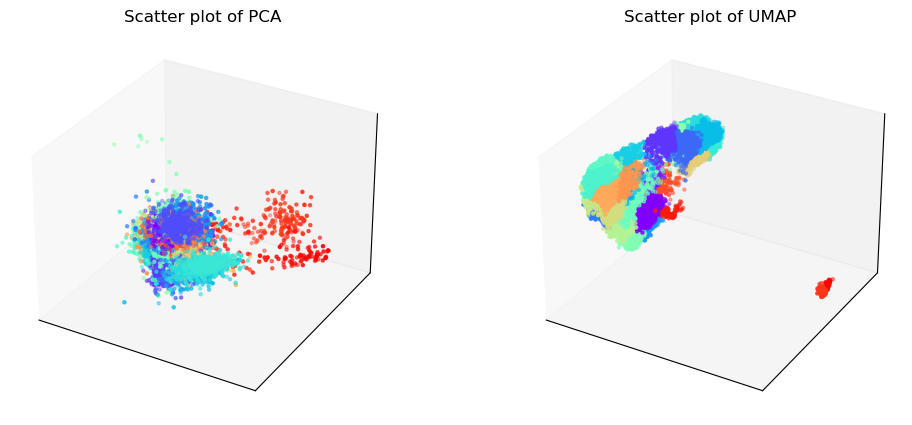

Phylogenetic tree in latent space will be shown below.


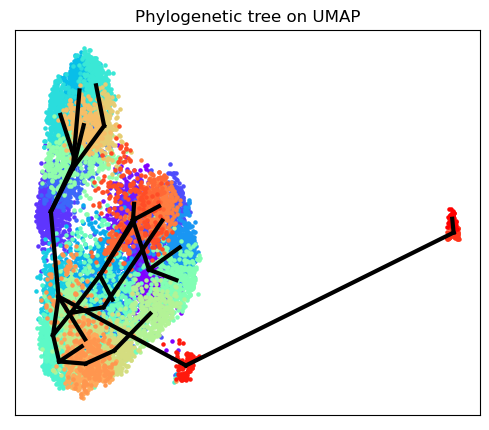

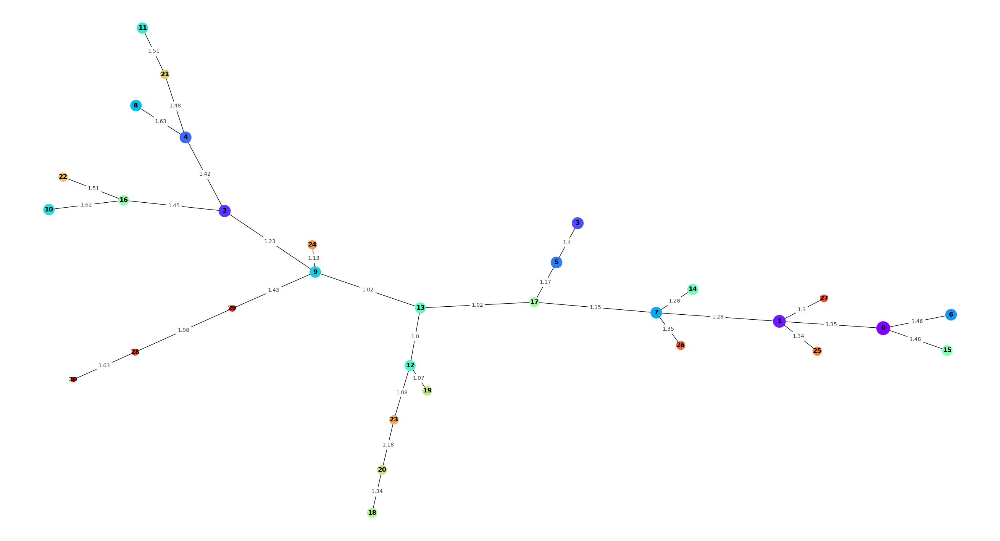

SNP-allelic ratios of 10936 cells and 50 SNPs will be shown below.


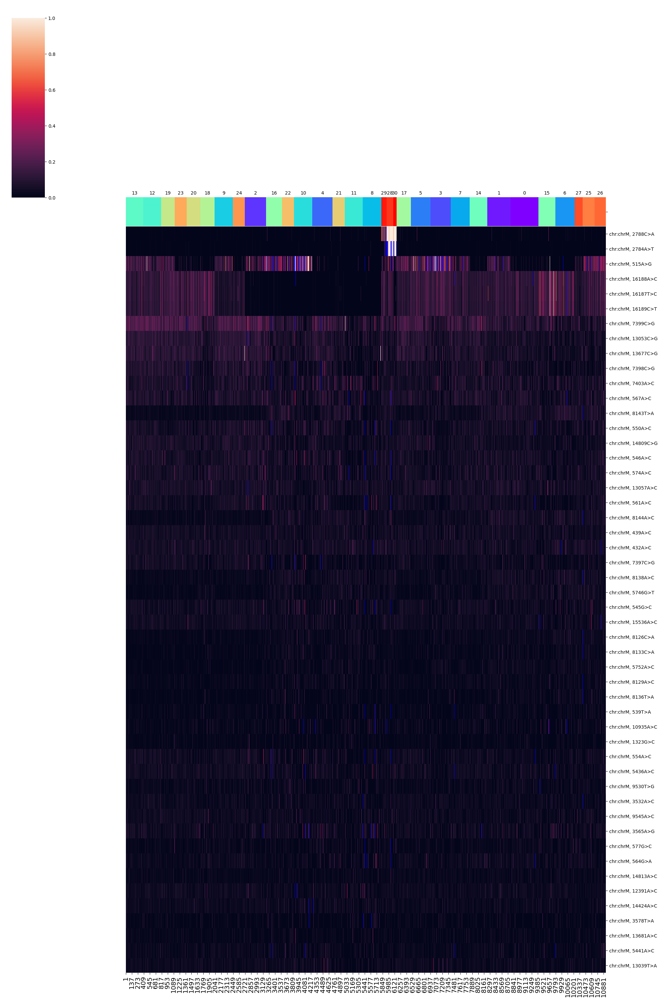

SNPs sorted by lowest p-value will be shown below


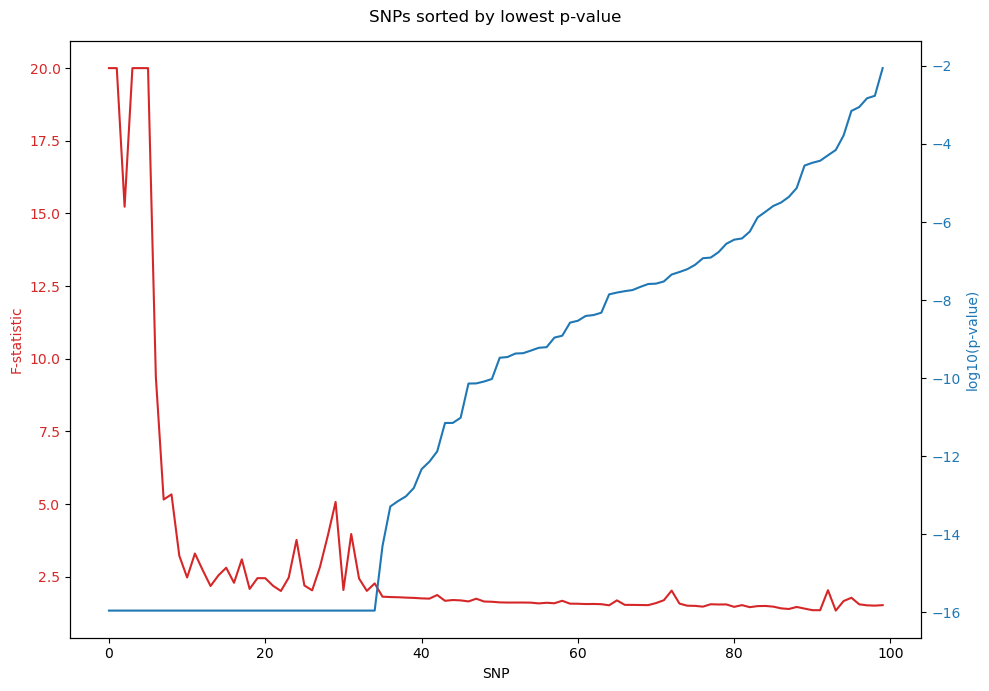

In [16]:
test2.clustering(algorithm = "leiden_umap3d")
test2.phylogeny()

PCA and UMAP of individual clusters will be shown below.


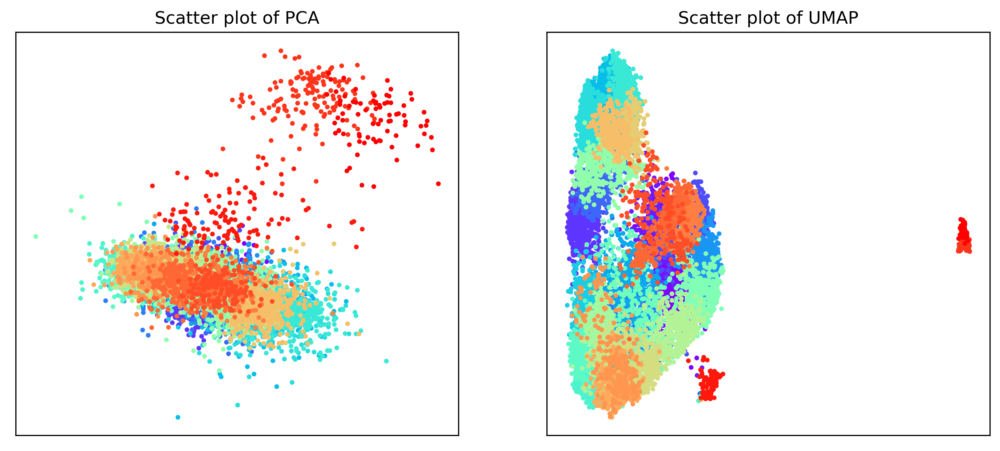

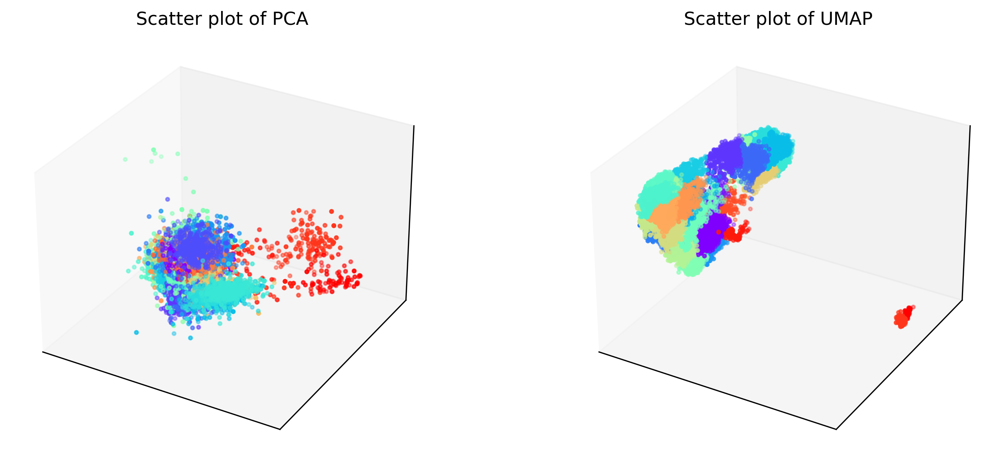

Phylogenetic tree in latent space will be shown below.


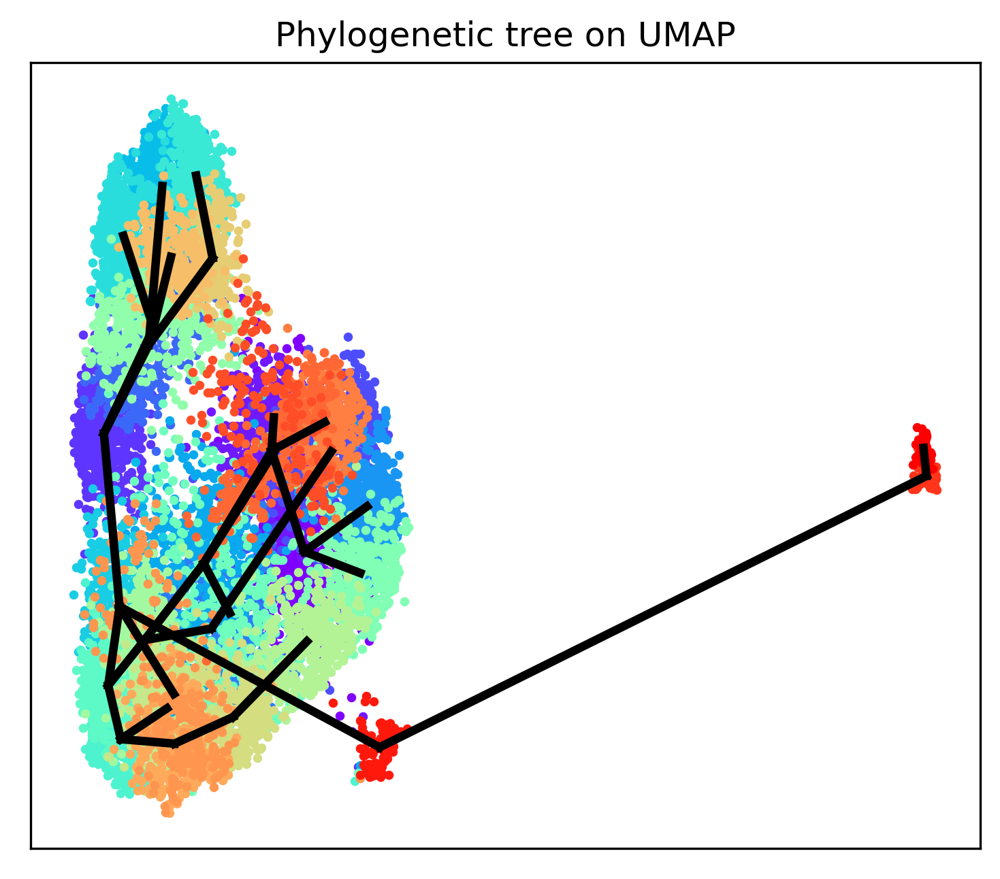

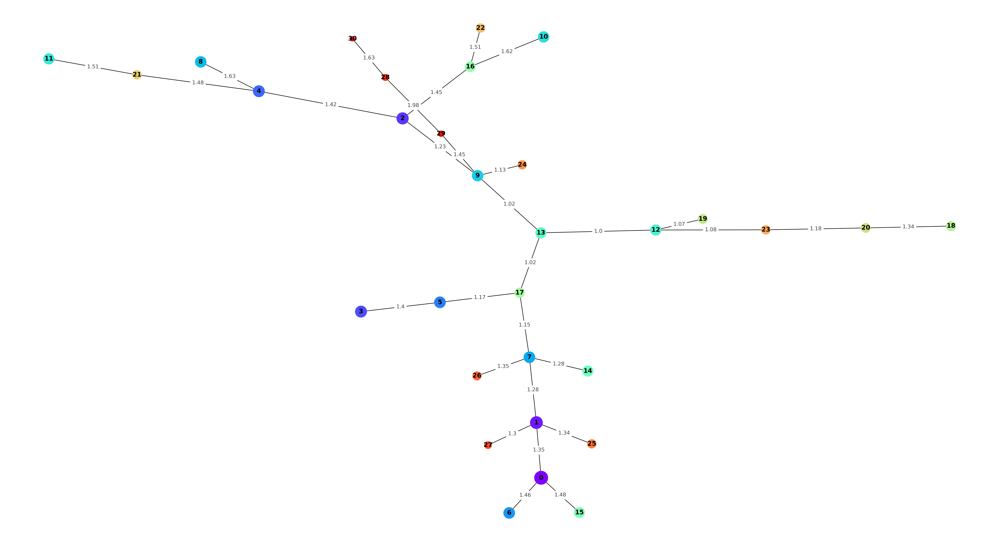

SNP-allelic ratios of 10936 cells and 10 SNPs will be shown below.


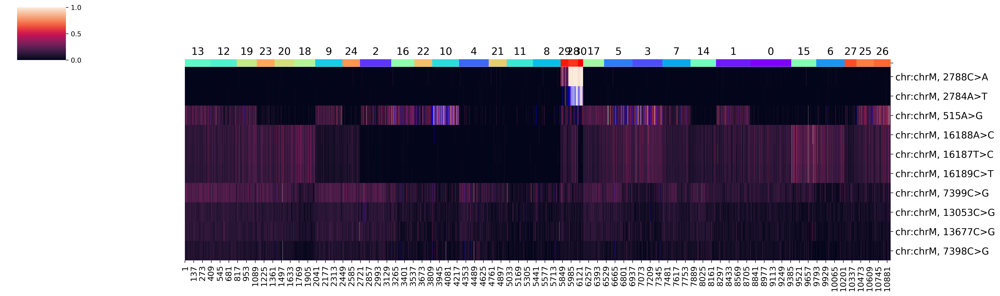

SNPs sorted by lowest p-value will be shown below


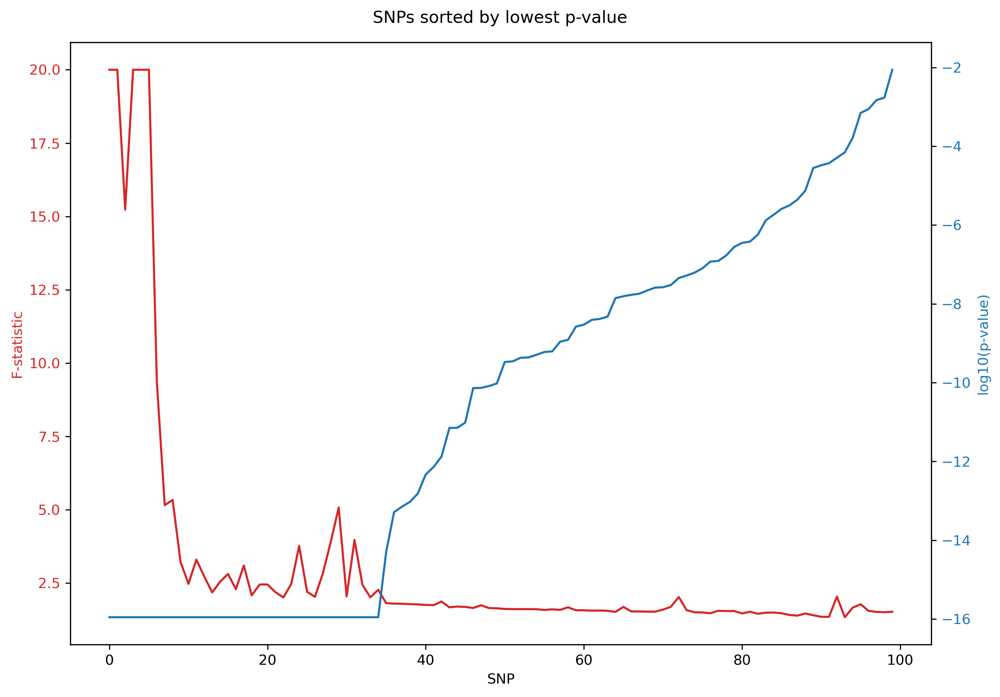

In [18]:
test2.phylogeny_summary(dpi = 300, SNP_no = 10, fontsize_y = 14, fontsize_x = 12, fontsize_c = 15)

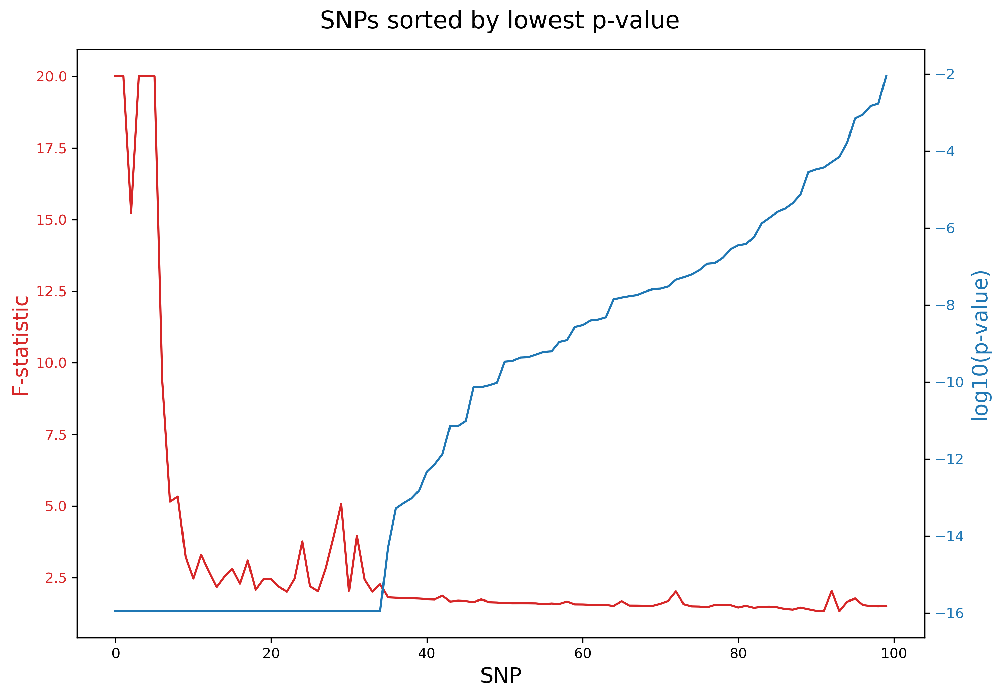

In [22]:
fig, ax1 = plt.subplots(dpi = 300)
fig.set_size_inches(10, 7)
fig.suptitle("SNPs sorted by lowest p-value", fontsize = 17)

ax1.set_xlabel('SNP', fontsize = 15)
ax1.set_ylabel('F-statistic', color = 'tab:red', fontsize = 15)
ax1.plot(np.arange(test2.SNP_total), test2.f_stat_ranked, color = 'tab:red')
ax1.tick_params(axis = 'y', labelcolor = 'tab:red')

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('log10(p-value)', color = 'tab:blue', fontsize = 15)
ax2.plot(np.arange(test2.SNP_total), np.log10(test2.p_value_ranked), color = 'tab:blue')
ax2.tick_params(axis = 'y', labelcolor = 'tab:blue')

fig.tight_layout()
plt.show()

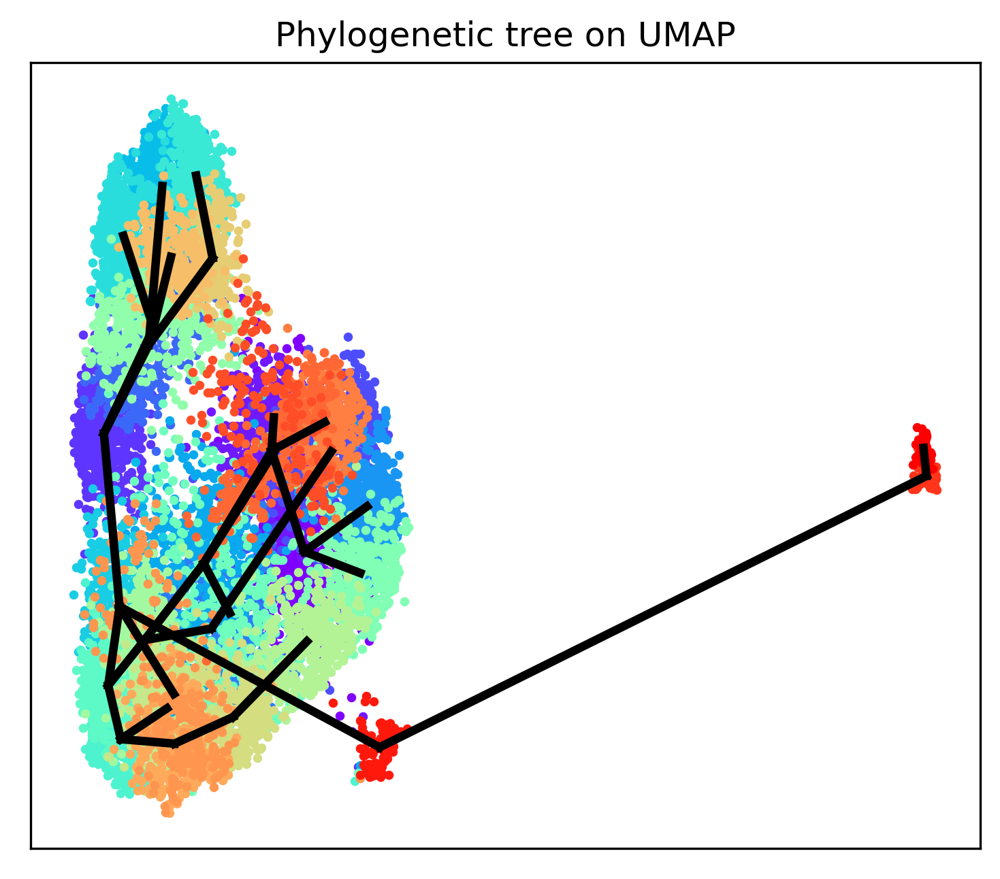

In [23]:
fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

axs.set_title("Phylogenetic tree on UMAP")
axs.set_xticks([])
axs.set_yticks([])

for g in range(test2.cluster_no):

    axs.scatter(test2.embedding_2d[test2.clusters[g], 0], test2.embedding_2d[test2.clusters[g], 1], s = 5, color = test2.colors[g])

for g in range(len(test2.edge)):

    axs.plot([test2.centre_2d[test2.edge[g][0], 0], test2.centre_2d[test2.edge[g][1], 0]], [test2.centre_2d[test2.edge[g][0], 1], test2.centre_2d[test2.edge[g][1], 1]], linewidth = 3, color = "black")

plt.show()

Phylogenetic tree in latent space will be shown below.


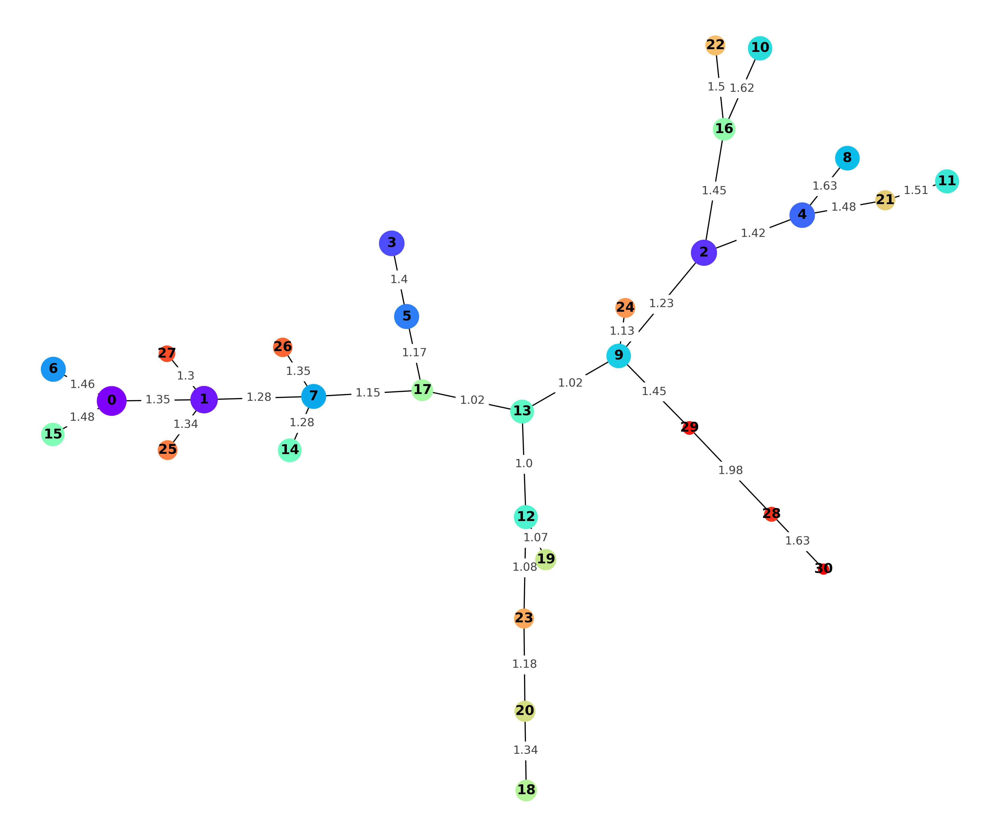

In [24]:
print(f"Phylogenetic tree in latent space will be shown below.")

graph = nx.Graph()

for u in range(len(test2.edge)):

    graph.add_edge(test2.edge[u][0], test2.edge[u][1], weight = test2.edge_weight[u], length = test2.edge_length_normalized[u])

pos = nx.spring_layout(graph, iterations = 3000, weight = 'weight')

plt.figure(figsize = (12, 10), dpi = 300) 
nx.draw(graph, pos, with_labels = True, font_weight = 'bold', node_size = test2.cluster_size[test2.connect_order], node_color = test2.colors[test2.connect_order])
nx.draw_networkx_edge_labels(graph, pos, nx.get_edge_attributes(graph, 'length'), rotate = False, alpha = 0.75)

plt.show()

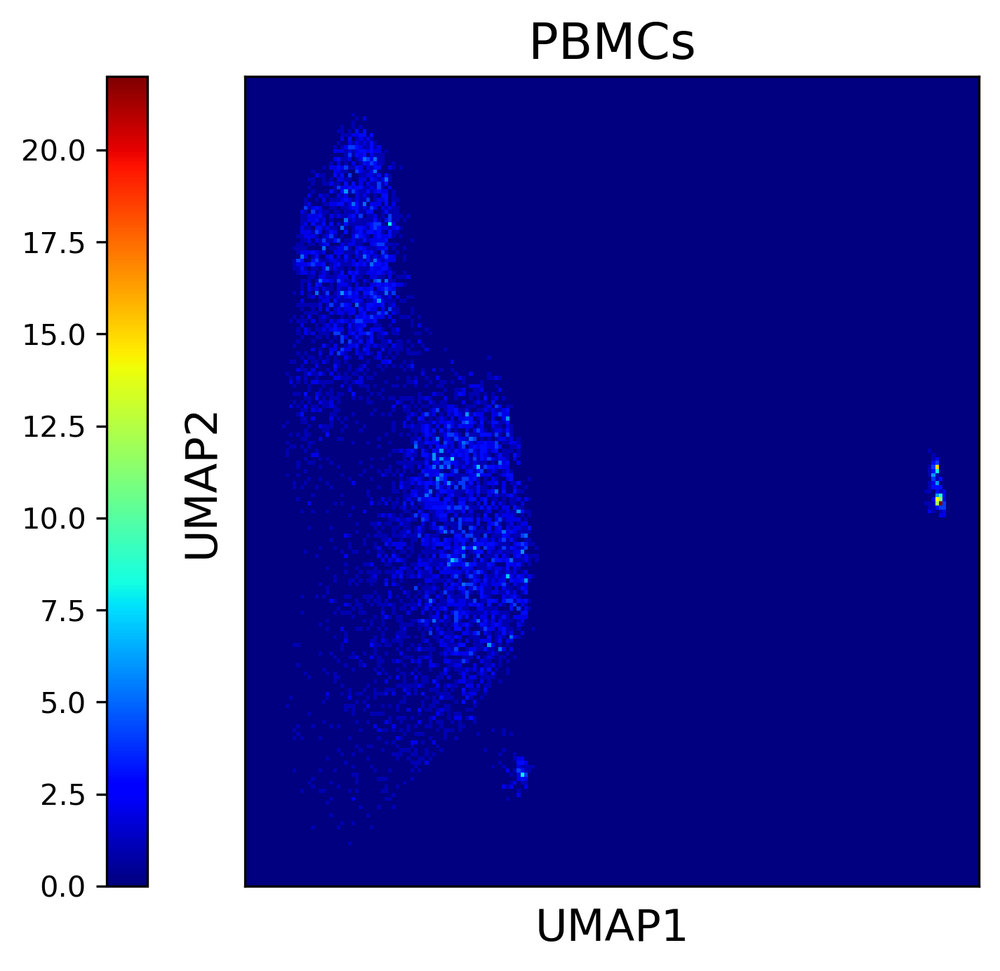

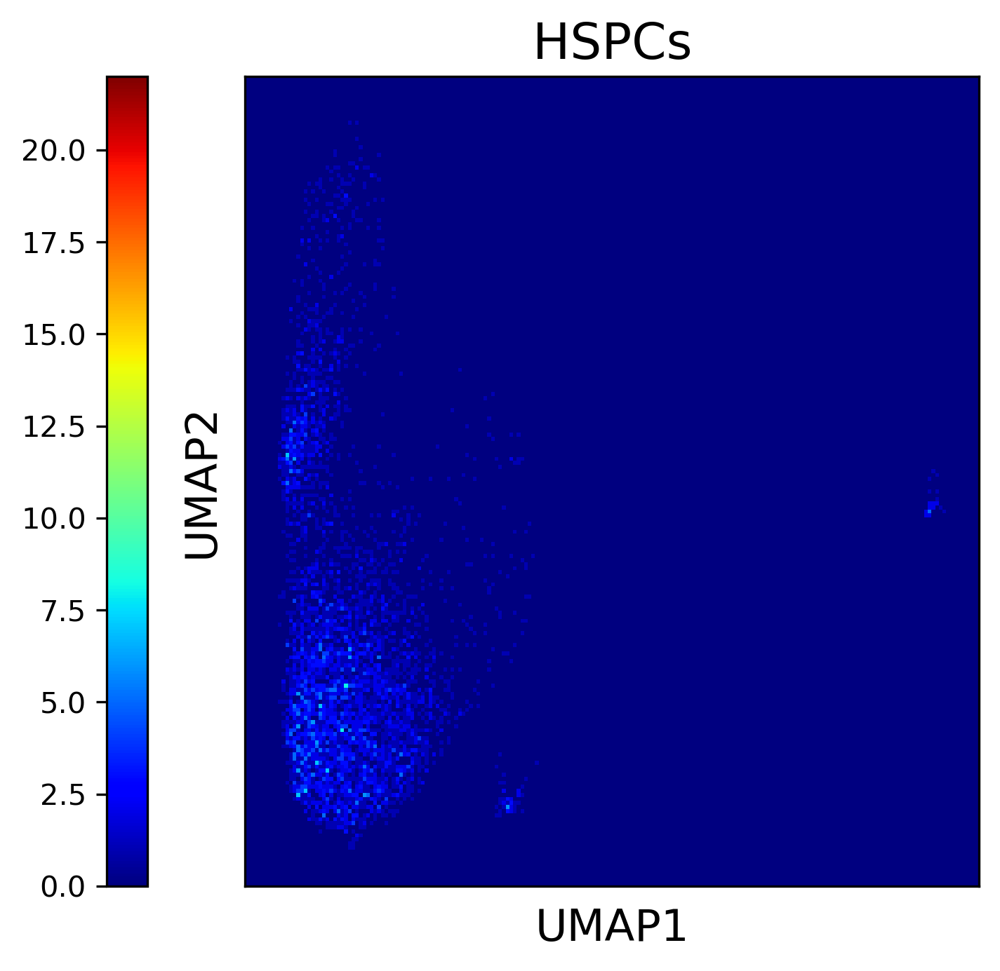

In [71]:
fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

h = axs.hist2d(test2.embedding_2d[4339:, 0], test2.embedding_2d[4339:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test2.xlim_embedding_2d, test2.ylim_embedding_2d]), vmax = test2.vmax_embedding_2d, vmin = test2.vmin_embedding_2d)
axs.set_xticks([])
axs.set_yticks([])
axs.set_title("PBMCs", fontsize = 17)
axs.set_xlabel("UMAP1", fontsize = 15)
axs.set_ylabel("UMAP2", fontsize = 15)
fig.colorbar(h[3], ax = axs, location = "left")

plt.show()

fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

h = axs.hist2d(test2.embedding_2d[:4339, 0], test2.embedding_2d[:4339, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test2.xlim_embedding_2d, test2.ylim_embedding_2d]), vmax = test2.vmax_embedding_2d, vmin = test2.vmin_embedding_2d)
axs.set_xticks([])
axs.set_yticks([])
axs.set_title("HSPCs", fontsize = 17)
axs.set_xlabel("UMAP1", fontsize = 15)
axs.set_ylabel("UMAP2", fontsize = 15)
fig.colorbar(h[3], ax = axs, location = "left")

plt.show()

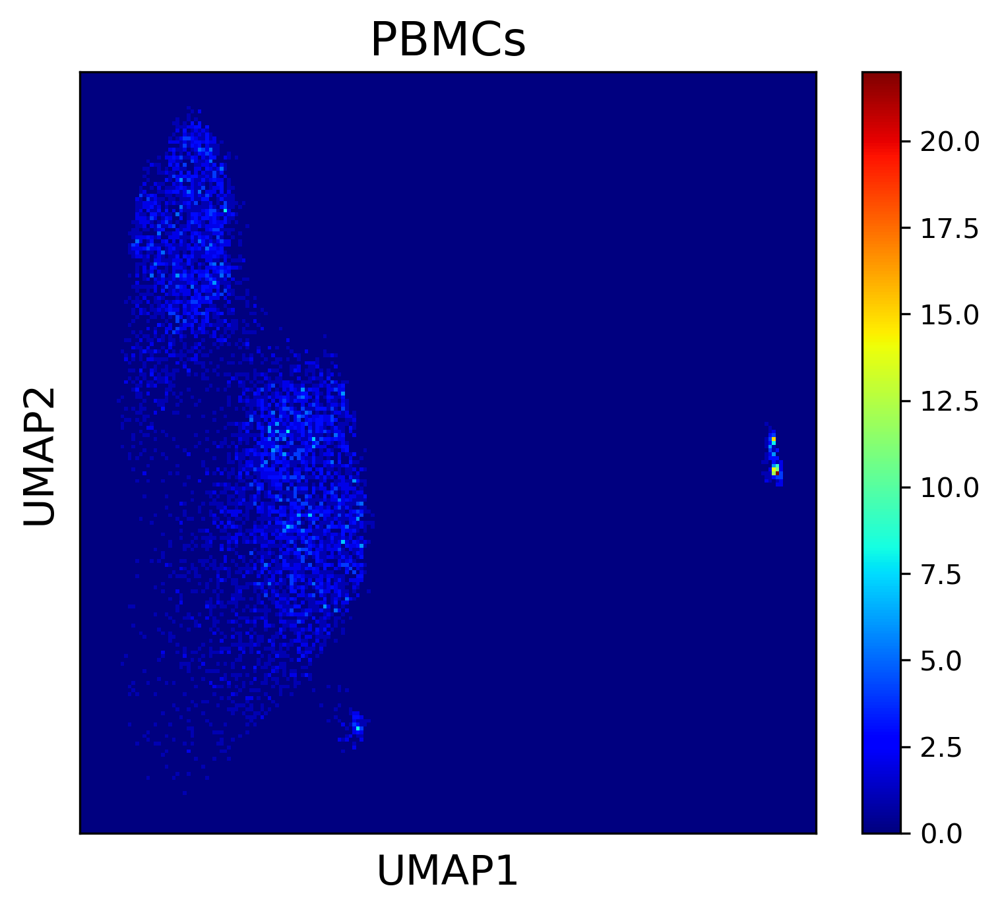

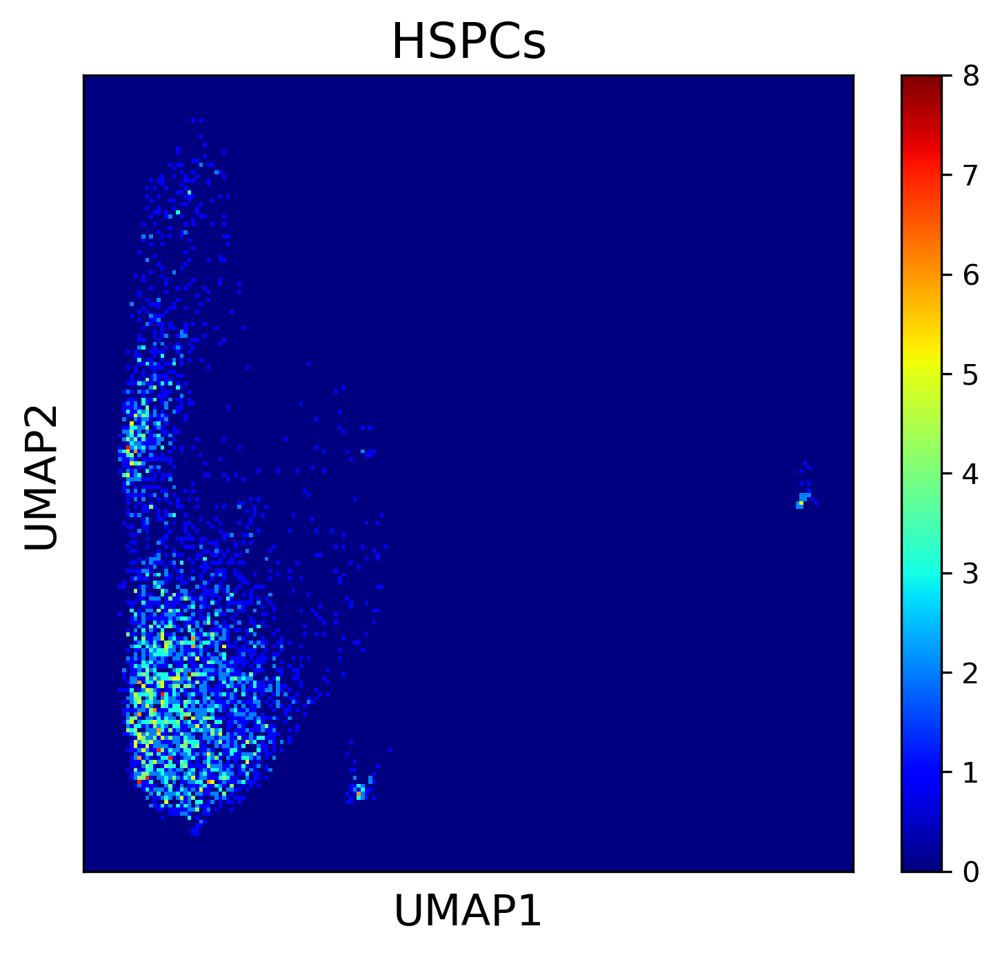

In [30]:
fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

h = axs.hist2d(test2.embedding_2d[4339:, 0], test2.embedding_2d[4339:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test2.xlim_embedding_2d, test2.ylim_embedding_2d]))
axs.set_xticks([])
axs.set_yticks([])
axs.set_title("PBMCs", fontsize = 17)
axs.set_xlabel("UMAP1", fontsize = 15)
axs.set_ylabel("UMAP2", fontsize = 15)
fig.colorbar(h[3], ax = axs)

plt.show()

fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

h = axs.hist2d(test2.embedding_2d[:4339, 0], test2.embedding_2d[:4339, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test2.xlim_embedding_2d, test2.ylim_embedding_2d]))
axs.set_xticks([])
axs.set_yticks([])
axs.set_title("HSPCs", fontsize = 17)
axs.set_xlabel("UMAP1", fontsize = 15)
axs.set_ylabel("UMAP2", fontsize = 15)
fig.colorbar(h[3], ax = axs)

plt.show()

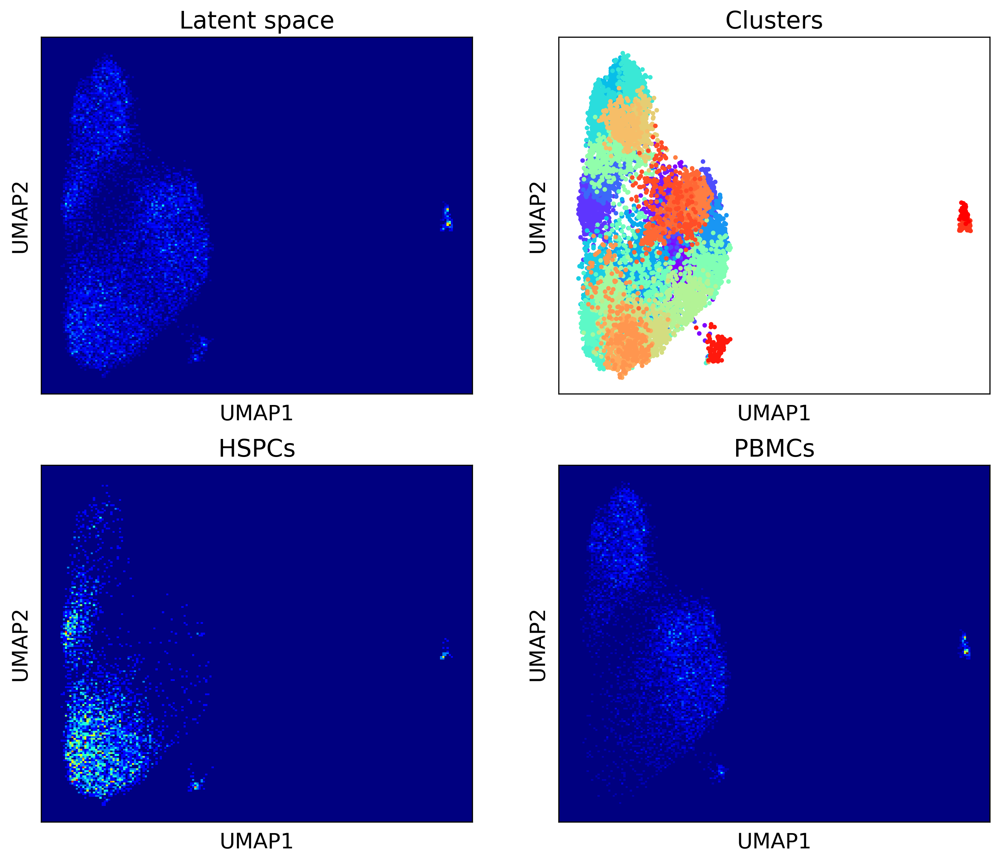

In [33]:
fig, axs = plt.subplots(2, 2, dpi = 300)
fig.set_size_inches(12, 10)

axs[0, 0].hist2d(test2.embedding_2d[:, 0], test2.embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test2.xlim_embedding_2d, test2.ylim_embedding_2d]))
axs[0, 0].set_xticks([])
axs[0, 0].set_yticks([])
axs[0, 0].set_title("Latent space", fontsize = 17)
axs[0, 0].set_xlabel("UMAP1", fontsize = 15)
axs[0, 0].set_ylabel("UMAP2", fontsize = 15)

axs[1, 0].hist2d(test2.embedding_2d[:4339, 0], test2.embedding_2d[:4339, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test2.xlim_embedding_2d, test2.ylim_embedding_2d]))
axs[1, 0].set_xticks([])
axs[1, 0].set_yticks([])
axs[1, 0].set_title("HSPCs", fontsize = 17)
axs[1, 0].set_xlabel("UMAP1", fontsize = 15)
axs[1, 0].set_ylabel("UMAP2", fontsize = 15)

axs[1, 1].hist2d(test2.embedding_2d[4339:, 0], test2.embedding_2d[4339:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test2.xlim_embedding_2d, test2.ylim_embedding_2d]))
axs[1, 1].set_xticks([])
axs[1, 1].set_yticks([])
axs[1, 1].set_title("PBMCs", fontsize = 17)
axs[1, 1].set_xlabel("UMAP1", fontsize = 15)
axs[1, 1].set_ylabel("UMAP2", fontsize = 15)

axs[0, 1].set_title("Clusters", fontsize = 17)

for w in range(test2.cluster_no):
    
    axs[0, 1].scatter(test2.embedding_2d[test2.clusters[w], 0], test2.embedding_2d[test2.clusters[w], 1], s = 5, color = test2.colors[w])
    
axs[0, 1].set_xticks([])
axs[0, 1].set_yticks([])
axs[0, 1].set_xlabel("UMAP1", fontsize = 15)
axs[0, 1].set_ylabel("UMAP2", fontsize = 15)

plt.show()

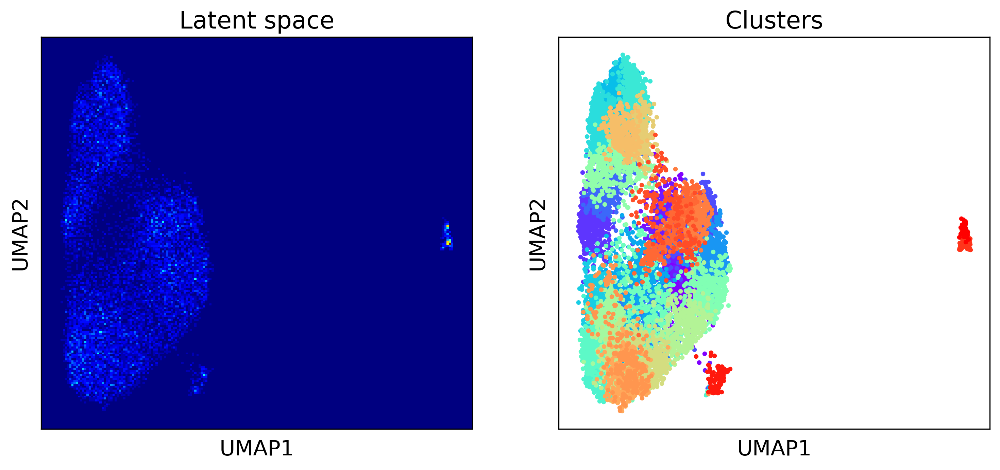

In [34]:
fig, axs = plt.subplots(1, 2, dpi = 300)
fig.set_size_inches(12, 5)

axs[0].hist2d(test2.embedding_2d[:, 0], test2.embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([test2.xlim_embedding_2d, test2.ylim_embedding_2d]))
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[0].set_title("Latent space", fontsize = 17)
axs[0].set_xlabel("UMAP1", fontsize = 15)
axs[0].set_ylabel("UMAP2", fontsize = 15)

axs[1].set_title("Clusters", fontsize = 17)

for w in range(test2.cluster_no):
    
    axs[1].scatter(test2.embedding_2d[test2.clusters[w], 0], test2.embedding_2d[test2.clusters[w], 1], s = 5, color = test2.colors[w])
    
axs[1].set_xticks([])
axs[1].set_yticks([])
axs[1].set_xlabel("UMAP1", fontsize = 15)
axs[1].set_ylabel("UMAP2", fontsize = 15)

plt.show()

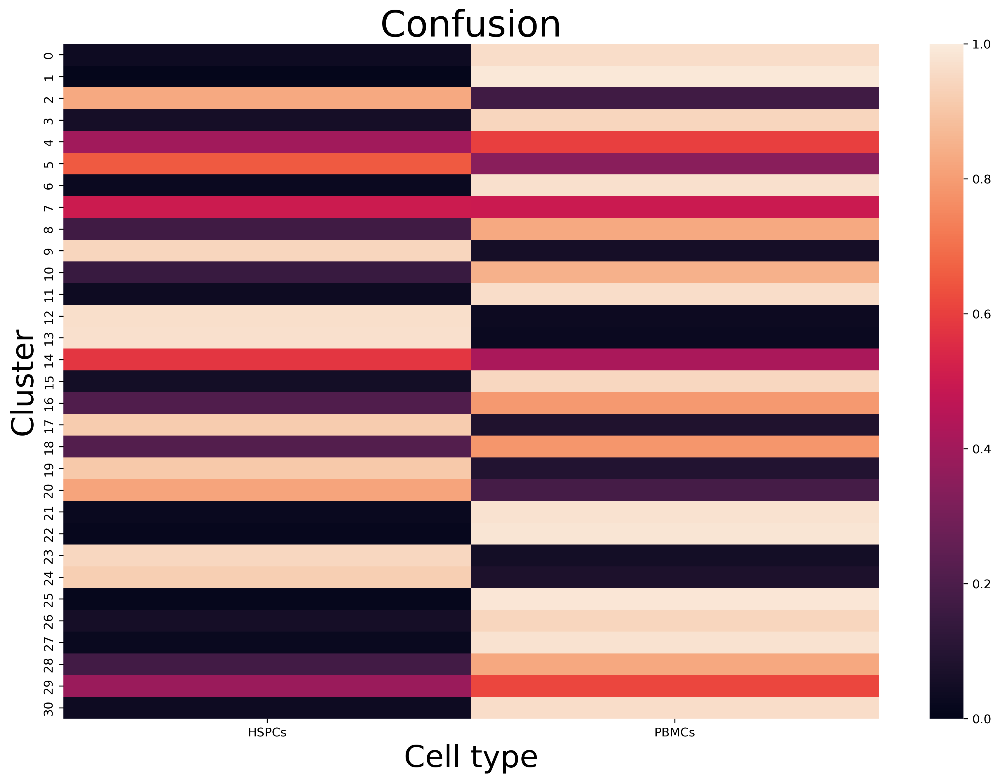

In [35]:
reference = np.empty(test2.cell_total)
reference[:4339] = 0
reference[4339:] = 1
reference = reference.astype(int)
predict = test2.assigned_label
    
matrix = np.zeros((2, test2.cluster_no))
ref_sum = np.zeros(test2.cluster_no)

for q in range(sum(test2.cell_filter)):

        matrix[reference[q], predict[q]] += 1
        ref_sum[predict[q]] += 1

prop = matrix / np.outer(np.ones(2), ref_sum)

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15, 10)
ax = sns.heatmap(prop.T, xticklabels = ["HSPCs", "PBMCs"], yticklabels = np.arange(0, test2.cluster_no), vmin = 0, vmax = 1)
ax.set_ylabel("Cluster", fontsize = 25)
ax.set_xlabel("Cell type", fontsize = 25)
ax.set_title("Confusion", fontsize = 30)
plt.gcf().set_dpi(300)
plt.show()

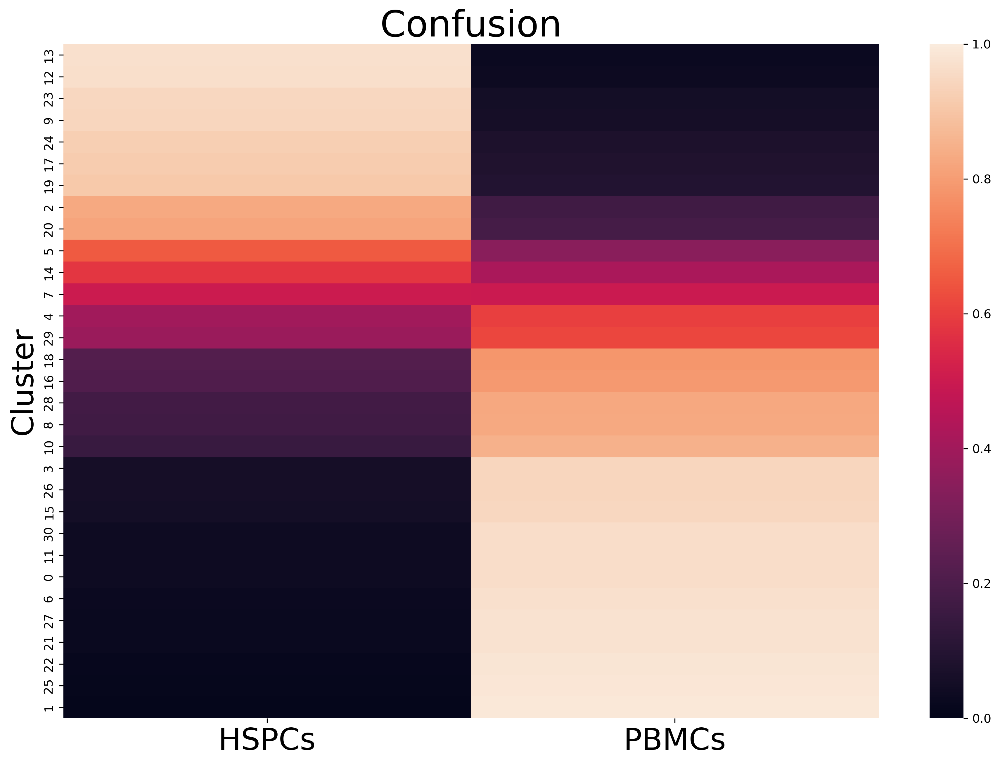

In [50]:
reference = np.empty(test2.cell_total)
reference[:4339] = 0
reference[4339:] = 1
reference = reference.astype(int)
predict = test2.assigned_label
    
matrix = np.zeros((2, test2.cluster_no))
ref_sum = np.zeros(test2.cluster_no)

for q in range(sum(test2.cell_filter)):

        matrix[reference[q], predict[q]] += 1
        ref_sum[predict[q]] += 1

prop = matrix / np.outer(np.ones(2), ref_sum)

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(15, 10)
ax = sns.heatmap(prop[:, np.flip(np.argsort(prop[0, :]))].T, xticklabels = ["HSPCs", "PBMCs"], yticklabels = np.flip(np.argsort(prop[0, :])), vmin = 0, vmax = 1)
ax.set_ylabel("Cluster", fontsize = 25)
ax.set_title("Confusion", fontsize = 30)
plt.gcf().set_dpi(300)
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize = 25)
plt.show()

Phylogenetic tree in latent space will be shown below.


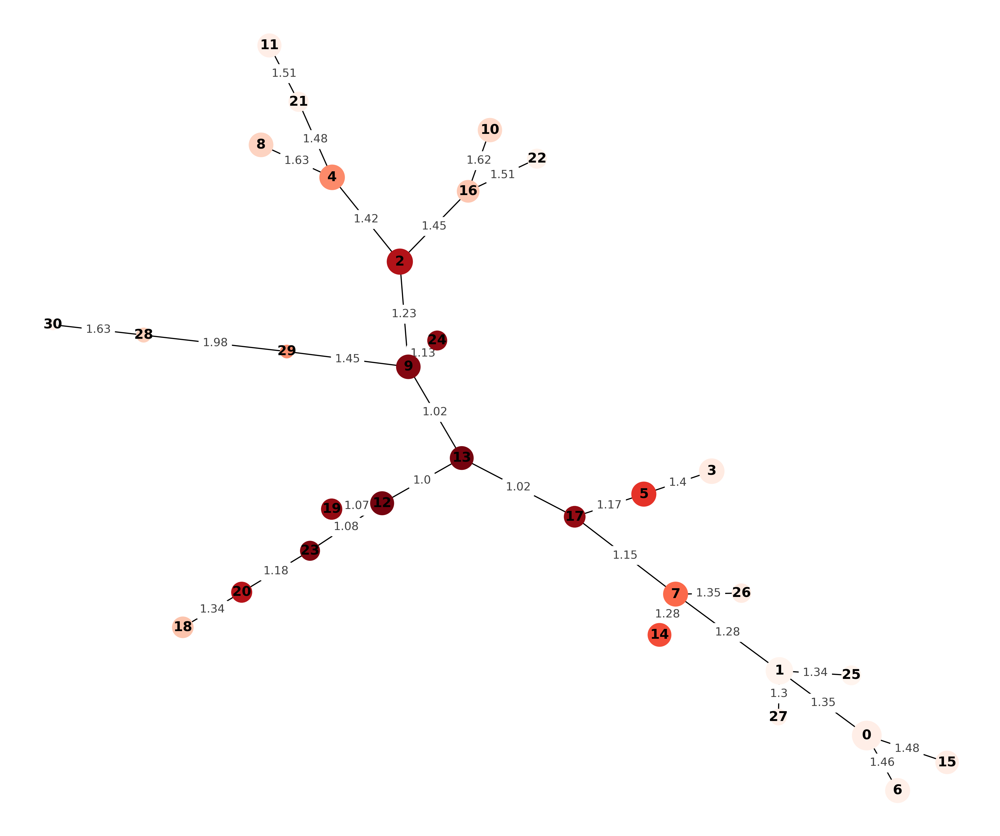

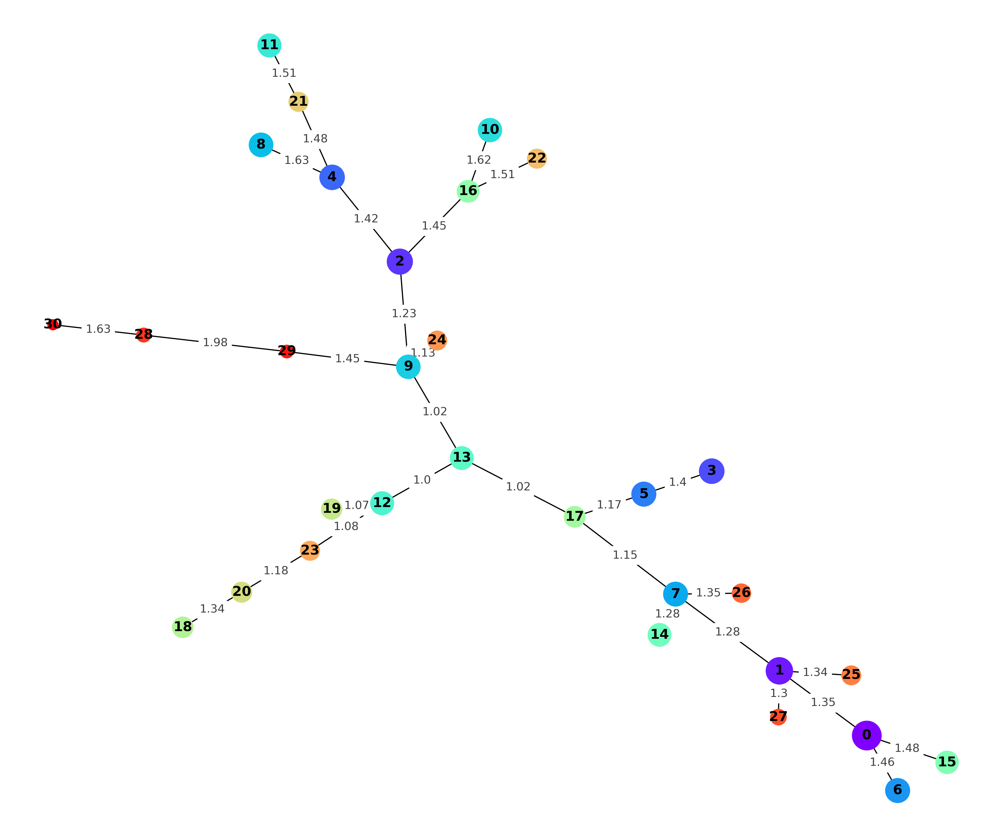

In [67]:
print(f"Phylogenetic tree in latent space will be shown below.")

color_AF = cm.Reds(np.linspace(0, 1, 101))

graph = nx.Graph()

for u in range(len(test2.edge)):

    graph.add_edge(test2.edge[u][0], test2.edge[u][1], weight = test2.edge_weight[u], length = test2.edge_length_normalized[u])

pos = nx.spring_layout(graph, iterations = 3000, weight = 'weight')

plt.figure(figsize = (12, 10), dpi = 300) 
nx.draw(graph, pos, with_labels = True, font_weight = 'bold', node_size = test2.cluster_size[test2.connect_order], node_color = color_AF[np.round(prop[:, test2.connect_order][0] * 100).astype(int), :])
nx.draw_networkx_edge_labels(graph, pos, nx.get_edge_attributes(graph, 'length'), rotate = False, alpha = 0.75)

plt.show()

plt.figure(figsize = (12, 10), dpi = 300) 
nx.draw(graph, pos, with_labels = True, font_weight = 'bold', node_size = test2.cluster_size[test2.connect_order], node_color = test2.colors[test2.connect_order])
nx.draw_networkx_edge_labels(graph, pos, nx.get_edge_attributes(graph, 'length'), rotate = False, alpha = 0.75)

plt.show()

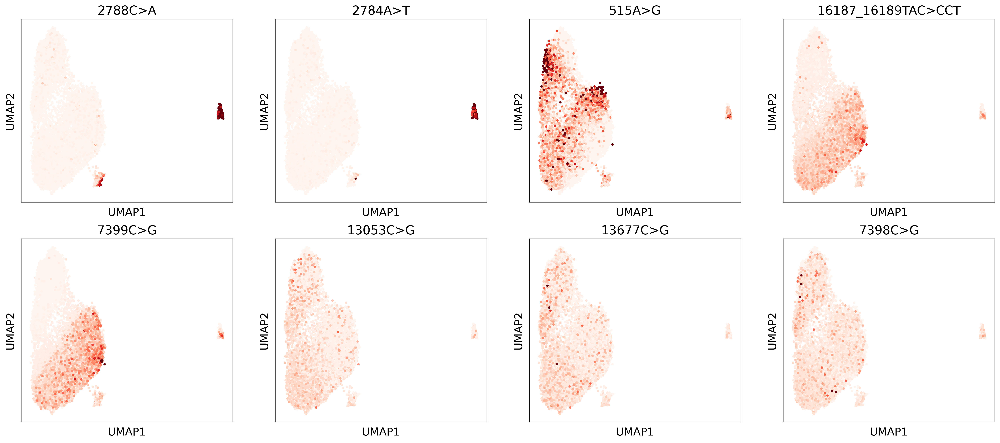

In [54]:
import collections

SNP_no = 10

AF_sorted_missing_to_zero = np.copy(test1.AF_sorted)
AF_sorted_missing_to_zero[np.isnan(test1.AF_sorted)] = 0

color_AF = cm.Reds(np.linspace(0, 1, 101))
embedding_2d_sorted = test1.embedding_2d[test1.cell_sorted, :]

fig, axs = plt.subplots(2, 4, dpi = 300)
fig.set_size_inches(24, 10)

AF_density = np.round(np.mean(AF_sorted_missing_to_zero[:SNP_no, :][[3, 4, 5], :], 0) * 100).astype(int)
counter = collections.Counter(AF_density)
numbers_AF = list(counter.keys())

axs[0, 3].set_title("16187_16189TAC>CCT", fontsize = 17)

for j in numbers_AF:

    axs[0, 3].scatter(embedding_2d_sorted[AF_density == j, 0], embedding_2d_sorted[AF_density == j, 1], s = 5, color = color_AF[j])

axs[0, 3].set_xticks([])
axs[0, 3].set_yticks([])
axs[0, 3].set_xlabel("UMAP1", fontsize = 15)
axs[0, 3].set_ylabel("UMAP2", fontsize = 15)

AF_density = np.round(AF_sorted_missing_to_zero[:SNP_no, :][9, :] * 100).astype(int)
counter = collections.Counter(AF_density)
numbers_AF = list(counter.keys())

axs[1, 3].set_title("7398C>G", fontsize = 17)

for j in numbers_AF:

    axs[1, 3].scatter(embedding_2d_sorted[AF_density == j, 0], embedding_2d_sorted[AF_density == j, 1], s = 5, color = color_AF[j])
    
axs[1, 3].set_xticks([])
axs[1, 3].set_yticks([])
axs[1, 3].set_xlabel("UMAP1", fontsize = 15)
axs[1, 3].set_ylabel("UMAP2", fontsize = 15)

for t in [0, 1, 2]:
    
    position1 = [0, 1, 2][t]
    position2 = [6, 7, 8][t]
    title1 = ["2788C>A", "2784A>T", "515A>G"][t]
    title2 = ["7399C>G", "13053C>G", "13677C>G"][t]
  
    AF_density = np.round(AF_sorted_missing_to_zero[:SNP_no, :][position1, :] * 100).astype(int)
    counter = collections.Counter(AF_density)
    numbers_AF = list(counter.keys())

    axs[0, t].set_title(title1, fontsize = 17)

    for j in numbers_AF:

        axs[0, t].scatter(embedding_2d_sorted[AF_density == j, 0], embedding_2d_sorted[AF_density == j, 1], s = 5, color = color_AF[j])

    axs[0, t].set_xticks([])
    axs[0, t].set_yticks([])
    axs[0, t].set_xlabel("UMAP1", fontsize = 15)
    axs[0, t].set_ylabel("UMAP2", fontsize = 15)

    AF_density = np.round(AF_sorted_missing_to_zero[:SNP_no, :][position2, :] * 100).astype(int)
    counter = collections.Counter(AF_density)
    numbers_AF = list(counter.keys())
    
    axs[1, t].set_title(title2, fontsize = 17)

    for j in numbers_AF:

        axs[1, t].scatter(embedding_2d_sorted[AF_density == j, 0], embedding_2d_sorted[AF_density == j, 1], s = 5, color = color_AF[j])

    axs[1, t].set_xticks([])
    axs[1, t].set_yticks([])
    axs[1, t].set_xlabel("UMAP1", fontsize = 15)
    axs[1, t].set_ylabel("UMAP2", fontsize = 15)


plt.show()

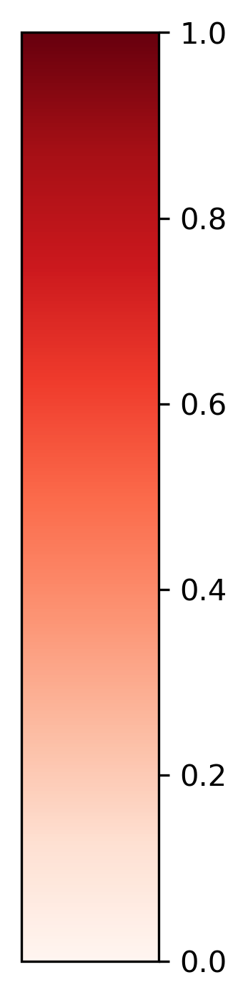

In [72]:
fig = plt.figure(dpi = 300)
ax = fig.add_axes([0.05, 0.80, 0.1, 0.9])

cb = mpl.colorbar.ColorbarBase(ax, orientation = 'vertical', cmap = 'Reds')

plt.show()

In [17]:
np.savetxt("assigned_label_umap3d.csv", test2.assigned_label, delimiter=",")
np.savetxt("assigned_label_latent.csv", test1.assigned_label, delimiter=",")
np.savetxt("embedding_2d.csv", test1.embedding_2d, delimiter=",")
np.savetxt("cell_filter.csv", test1.cell_filter, delimiter=",")
np.savetxt("SNP_filter.csv", test1.SNP_filter, delimiter=",")
np.savetxt("latent.csv", test1.latent, delimiter=",")
np.savetxt("embedding_3d.csv", test1.embedding_3d, delimiter=",")

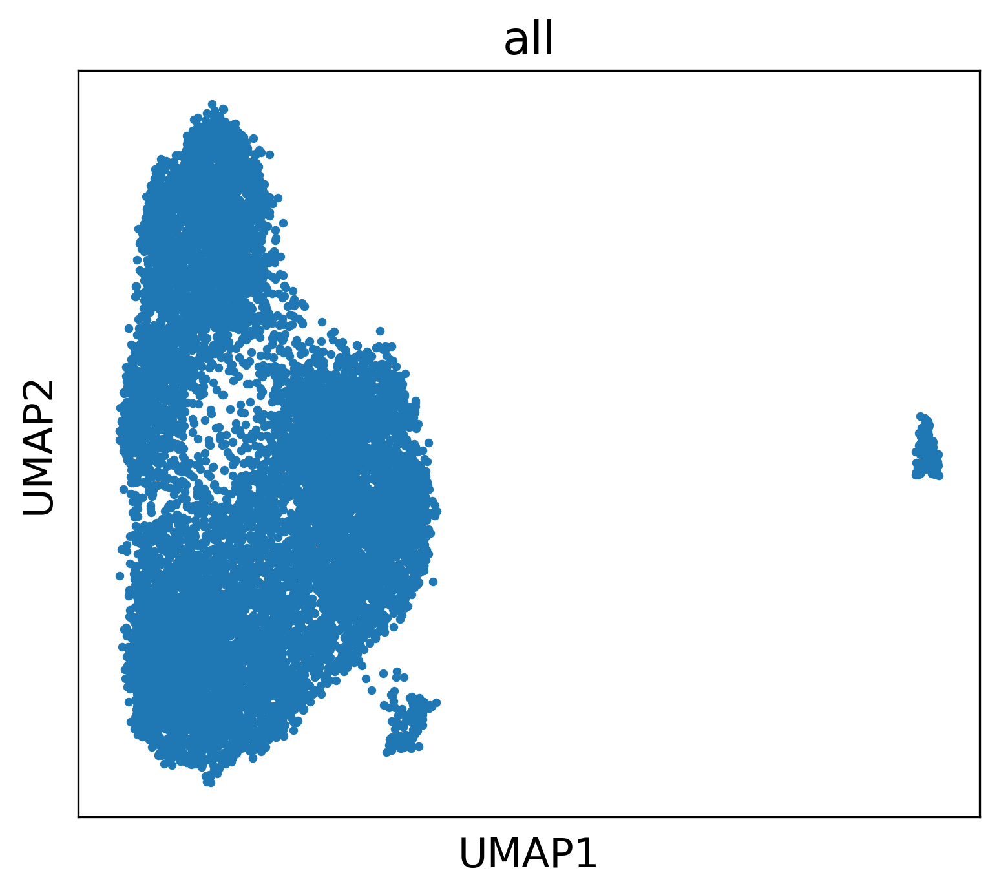

In [3]:
fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

axs.scatter(embedding_2d[:, 0], embedding_2d[:, 1], s = 5)
axs.set_xticks([])
axs.set_yticks([])
axs.set_title("all", fontsize = 17)
axs.set_xlabel("UMAP1", fontsize = 15)
axs.set_ylabel("UMAP2", fontsize = 15)

xlim_embedding_2d = axs.get_xlim()
ylim_embedding_2d = axs.get_ylim()

plt.show()

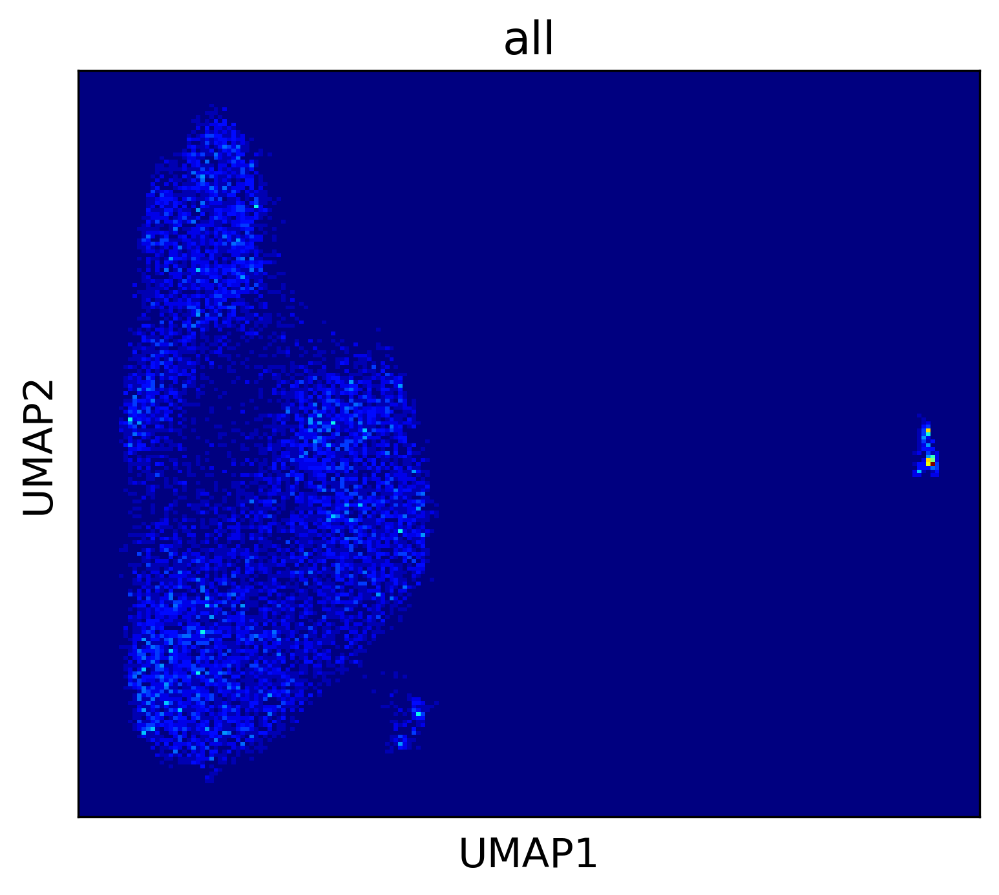

In [6]:
fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

h = axs.hist2d(embedding_2d[:, 0], embedding_2d[:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([xlim_embedding_2d, ylim_embedding_2d]))
axs.set_xticks([])
axs.set_yticks([])
axs.set_title("all", fontsize = 17)
axs.set_xlabel("UMAP1", fontsize = 15)
axs.set_ylabel("UMAP2", fontsize = 15)

plt.show()

vmax_embedding_2d = np.max(h[0])
vmin_embedding_2d = np.min(h[0])

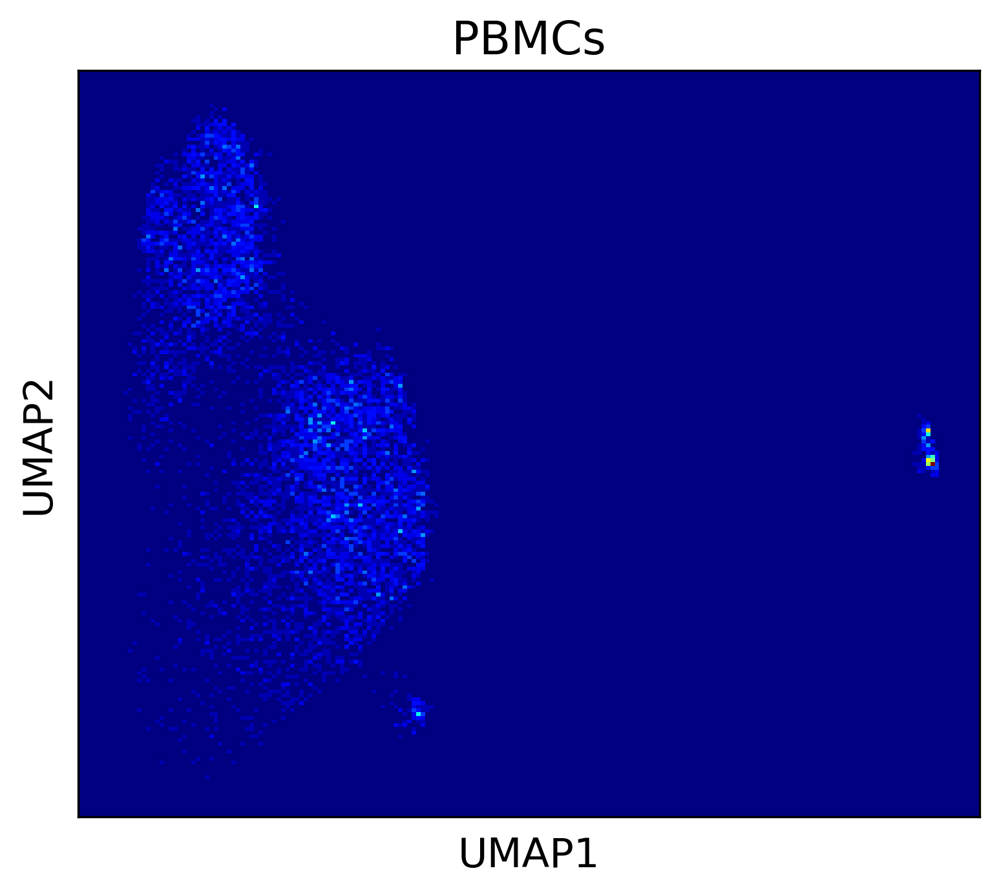

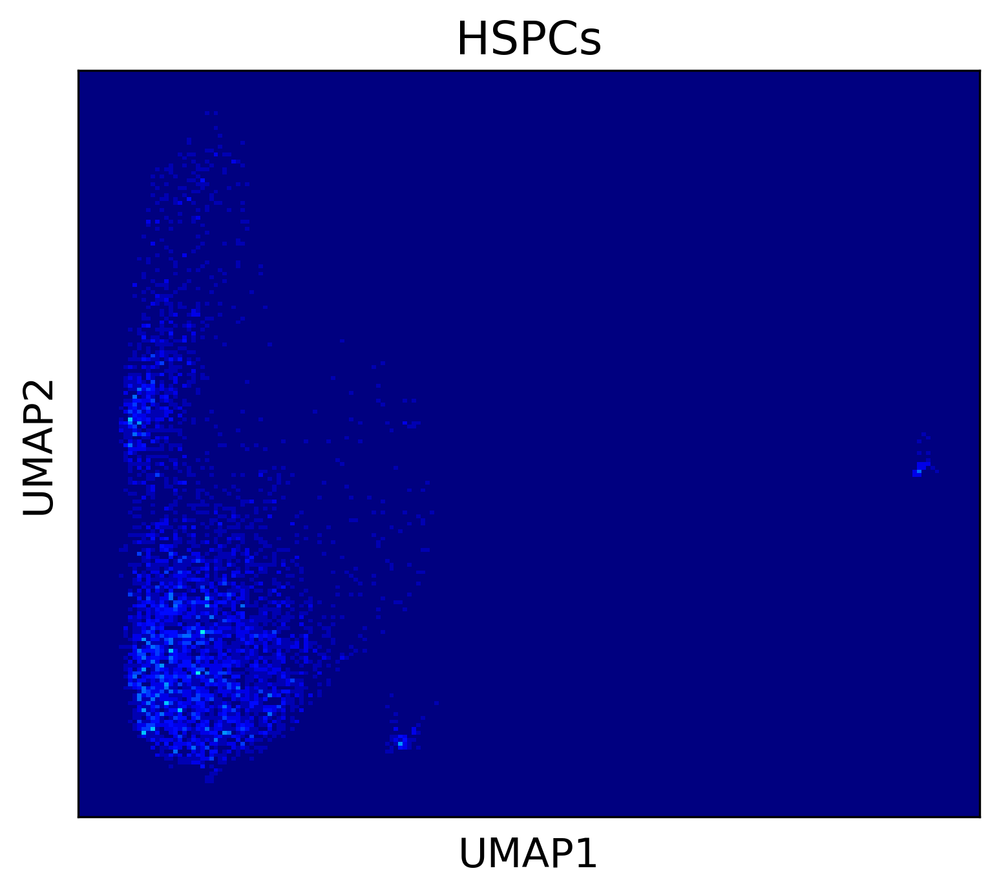

In [8]:
import numpy as np
import pandas as pd
import matplotlib.cm as cm 
import matplotlib.pyplot as plt

embedding_2d = np.genfromtxt("embedding_2d.csv", delimiter=",")

fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

h = axs.hist2d(embedding_2d[4339:, 0], embedding_2d[4339:, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([xlim_embedding_2d, ylim_embedding_2d]), vmax = vmax_embedding_2d, vmin = vmin_embedding_2d)
axs.set_xticks([])
axs.set_yticks([])
axs.set_title("PBMCs", fontsize = 17)
axs.set_xlabel("UMAP1", fontsize = 15)
axs.set_ylabel("UMAP2", fontsize = 15)

plt.show()

fig, axs = plt.subplots(1, 1, dpi = 300)
fig.set_size_inches(6, 5)

h = axs.hist2d(embedding_2d[:4339, 0], embedding_2d[:4339, 1], bins = (200, 200), cmap = plt.cm.jet, range = np.array([xlim_embedding_2d, ylim_embedding_2d]), vmax = vmax_embedding_2d, vmin = vmin_embedding_2d)
axs.set_xticks([])
axs.set_yticks([])
axs.set_title("HSPCs", fontsize = 17)
axs.set_xlabel("UMAP1", fontsize = 15)
axs.set_ylabel("UMAP2", fontsize = 15)

plt.show()